# Customer Churn Prediction

## Business Understanding

Syriatel is telecommunications company that has concerns regarding churn rate.Using customer account data,we will analyze what features from the data are most important in prediciting customer churn, or whether or not they will leave the company. In order to do this the notebook will provide classification models aimed at producing the highest possible recall metric

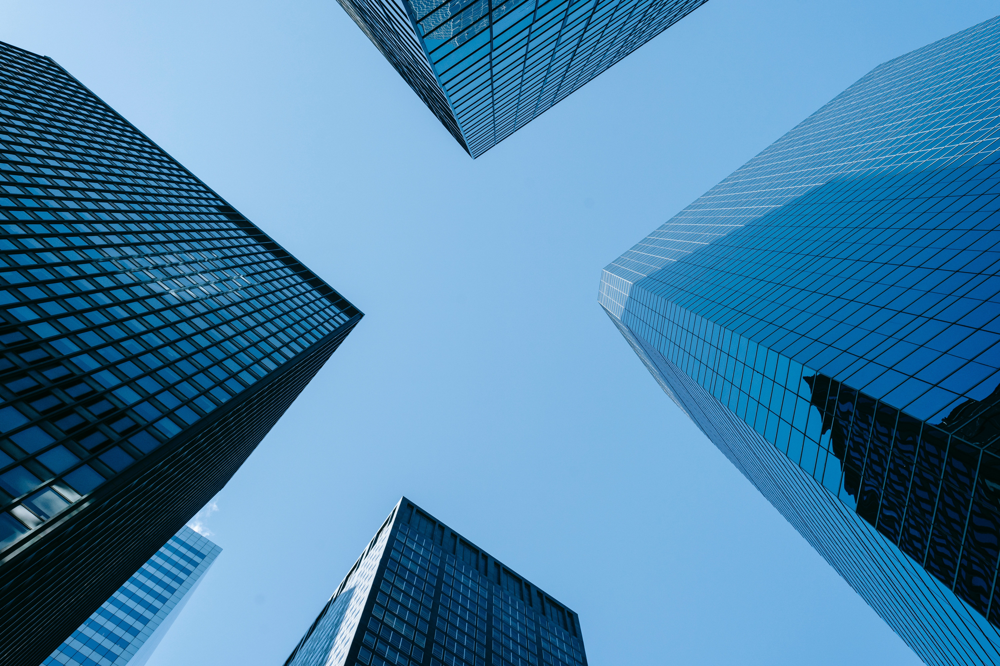

### Importing Libraries

In [125]:
# import the necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score, KFold
from sklearn.preprocessing import StandardScaler, MinMaxScaler,OneHotEncoder,LabelEncoder
from sklearn.impute import SimpleImputer

from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from imblearn.pipeline import pipeline

from sklearn.metrics import confusion_matrix, plot_confusion_matrix, classification_report
from sklearn.metrics import accuracy_score, recall_score, f1_score, roc_auc_score, roc_curve, precision_score, auc, recall_score

from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from imblearn.over_sampling import SMOTE
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier, plot_importance

import warnings
warnings.filterwarnings('ignore')

# Plotting pretty figures and avoid blurry images
%config InlineBackend.figure_format = 'retina'
# Larger scale for plots in notebooks
sns.set_context('notebook')


## Data Understanding

In [126]:
df = pd.read_csv('data.csv')
df.head()

,state,account length,area code,phone number,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,...,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,churn
0,KS,128,415,382-4657,no,yes,25,265.1,110,45.07,...,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,OH,107,415,371-7191,no,yes,26,161.6,123,27.47,...,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,NJ,137,415,358-1921,no,no,0,243.4,114,41.38,...,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,OH,84,408,375-9999,yes,no,0,299.4,71,50.90,...,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,OK,75,415,330-6626,yes,no,0,166.7,113,28.34,...,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False


### Data Description

The dataset contains relevant customer account data including:

`state` : The state the customer is from

`account lenght` : The account length of the customer

`area code`: the customer's area code

`international plan` : Whether or not the customer has an international plan

`voice mail plan` : Whether or not the customer has a voicemail plan

 The total day, evening, night, and international minutes of the customer

 The total day, evening, night, and international calls of the customer

 The total day, evening, night, and international charge of the customer

`customer service call` : The total customer service calls of the customer

`churn` : Whether or not the customer was 'true' or 'false' churn (true churn meaning that they have left the company, this will be the primary focus of the models)

In [127]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3333 entries, 0 to 3332
Data columns (total 21 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   state                   3333 non-null   object 
 1   account length          3333 non-null   int64  
 2   area code               3333 non-null   int64  
 3   phone number            3333 non-null   object 
 4   international plan      3333 non-null   object 
 5   voice mail plan         3333 non-null   object 
 6   number vmail messages   3333 non-null   int64  
 7   total day minutes       3333 non-null   float64
 8   total day calls         3333 non-null   int64  
 9   total day charge        3333 non-null   float64
 10  total eve minutes       3333 non-null   float64
 11  total eve calls         3333 non-null   int64  
 12  total eve charge        3333 non-null   float64
 13  total night minutes     3333 non-null   float64
 14  total night calls       3333 non-null   

In [128]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
account length,3333.0,101.064806,39.822106,1.00,74.00,101.00,127.00,243.00
area code,3333.0,437.182418,42.371290,408.00,408.00,415.00,510.00,510.00
number vmail messages,3333.0,8.099010,13.688365,0.00,0.00,0.00,20.00,51.00
total day minutes,3333.0,179.775098,54.467389,0.00,143.70,179.40,216.40,350.80
total day calls,3333.0,100.435644,20.069084,0.00,87.00,101.00,114.00,165.00
total day charge,3333.0,30.562307,9.259435,0.00,24.43,30.50,36.79,59.64
total eve minutes,3333.0,200.980348,50.713844,0.00,166.60,201.40,235.30,363.70
total eve calls,3333.0,100.114311,19.922625,0.00,87.00,100.00,114.00,170.00
total eve charge,3333.0,17.083540,4.310668,0.00,14.16,17.12,20.00,30.91
total night minutes,3333.0,200.872037,50.573847,23.20,167.00,201.20,235.30,395.00


### Data Exploration

In [129]:
# I will drop irrevalent columns
df = df.drop(['phone number' , 'area code'] , axis=1)

In [130]:
# df_cont1 = df.drop(columns=['state', 'international plan', 'voice mail plan', 'churn', 'area code'])
# All contunious variables
df_cont = df.select_dtypes(include=[np.number])
# All categorical variables
df_cat = df.select_dtypes(exclude=[np.number])
df_cat = df_cat.drop('churn' , axis=1)

In [131]:
# sns.pairplot(df_cont);

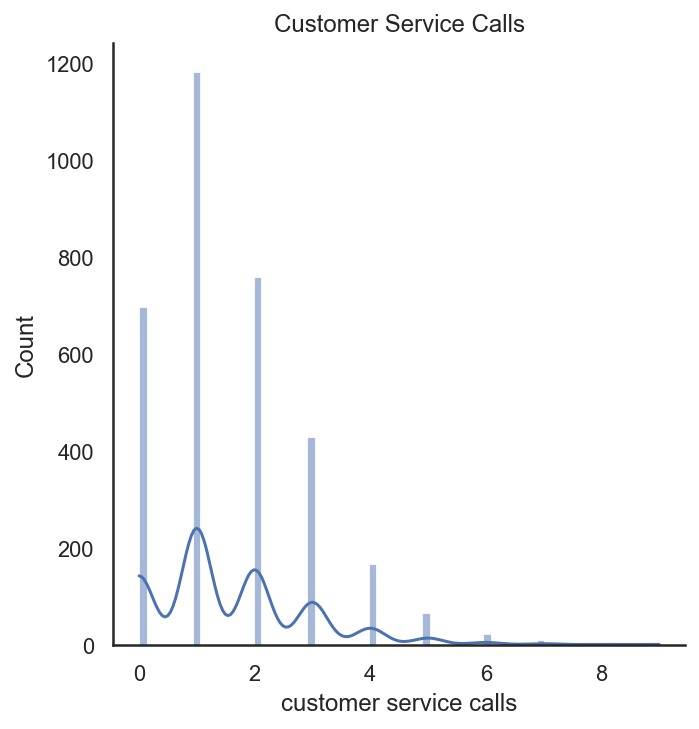

In [132]:
# Looking at the features that dont have normal distrubiton
sns.displot(x=df['customer service calls'],kind='hist',kde=True).set(title='Customer Service Calls');

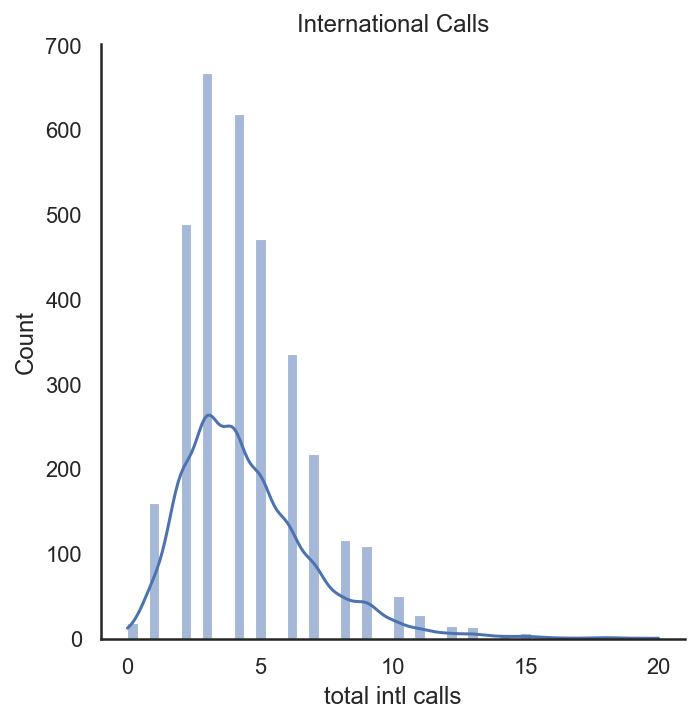

In [133]:
# Looking at the features that dont have normal distrubiton
sns.displot(x=df['total intl calls'],kind='hist',kde=True).set(title='International Calls');

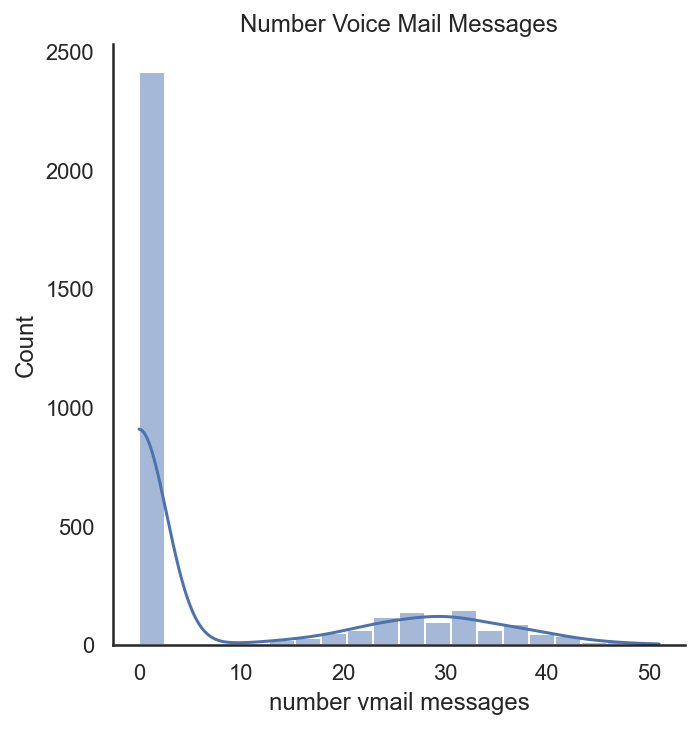

In [134]:
# Looking at the features that dont have normal distrubiton
sns.displot(x=df['number vmail messages'],kind='hist',kde=True).set(title='Number Voice Mail Messages');

- All feature columns have a normal distrubution except for `customer service calls`, `total intl calls`, `number vmail messages`.
- Features  with a 45 degree angle above graphs (`total day charge` and `total day minutes` etc.) are positively correlated.It's sign of multicollinearity. I might remove one of the features further to get better dataset
- `number vmail messages` does not appear evenly distributed with a large portion of customers having 0 messages. This would make sense as many customers probably delete their voicemail messages and likely would not be a predicitor of churn.
- `total intl calls` appears somewhat evenly distributed except for outliers over about 12. This would make sense as several customers are likely international customers making a lot of international calls. This likely would not have an effect on churn.
- `customer service calls` does not appear to be evenly distributed. This feature could be relevant at predicting churn as cutomers who are unhappy with their service would likely make more customer service calls.



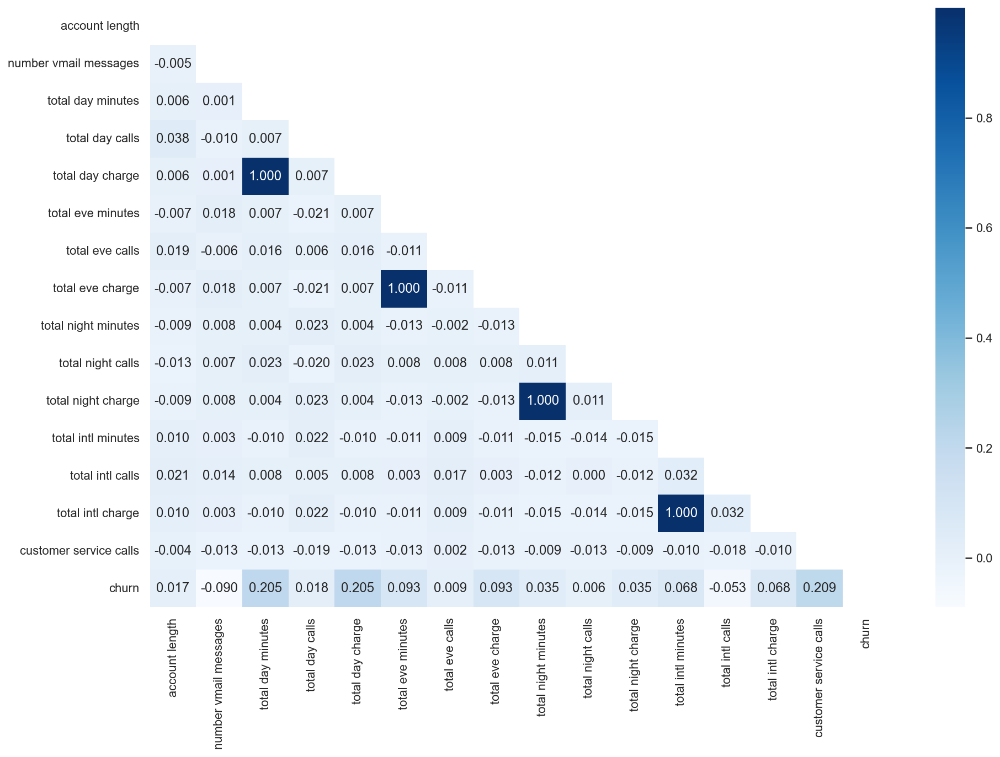

In [135]:
plt.figure(figsize = (15,10));
mask = np.triu(df.corr());
sns.heatmap(df.corr(), cmap = "Blues",annot = True, fmt = '.3f',mask = mask);

- `total day charge`    and  `total day minutes`
- `total eve charge`    and  `total eve minutes` 
- `total night charge`  and  `total night minutes`
- `total intl charge`   and  `total intl minutes` are highly correlated.

Will need to drop one of these features when building models to prevent multicollinearity.

In [136]:
# Check the balance of target values
print(df['churn'].value_counts())
print()
print('Check percentages:')
print(df['churn'].value_counts(normalize = True))

False    2850
True      483
Name: churn, dtype: int64

Check percentages:
False    0.855086
True     0.144914
Name: churn, dtype: float64


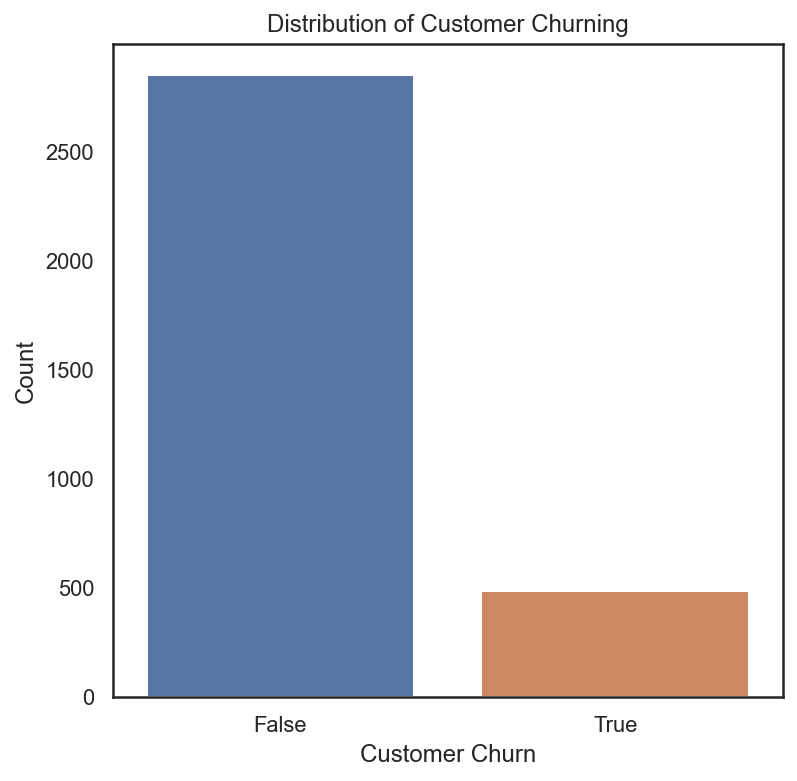

In [137]:
plt.figure(figsize=(6,6));
sns.countplot(x= df.churn);
plt.xlabel('Customer Churn');
plt.ylabel('Count');
plt.title('Distribution of Customer Churning');
plt.show()


- There is imbalance , we will have to deal with during the modeling phase

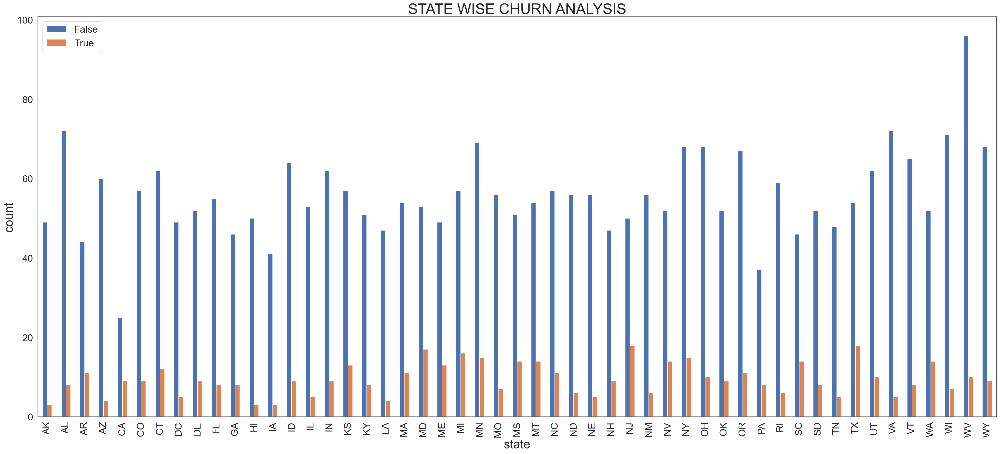

<Figure size 432x288 with 0 Axes>

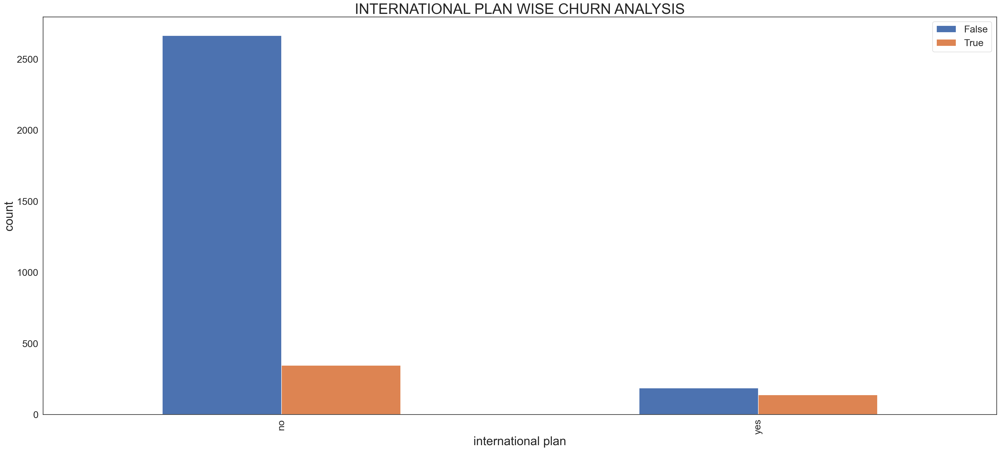

<Figure size 432x288 with 0 Axes>

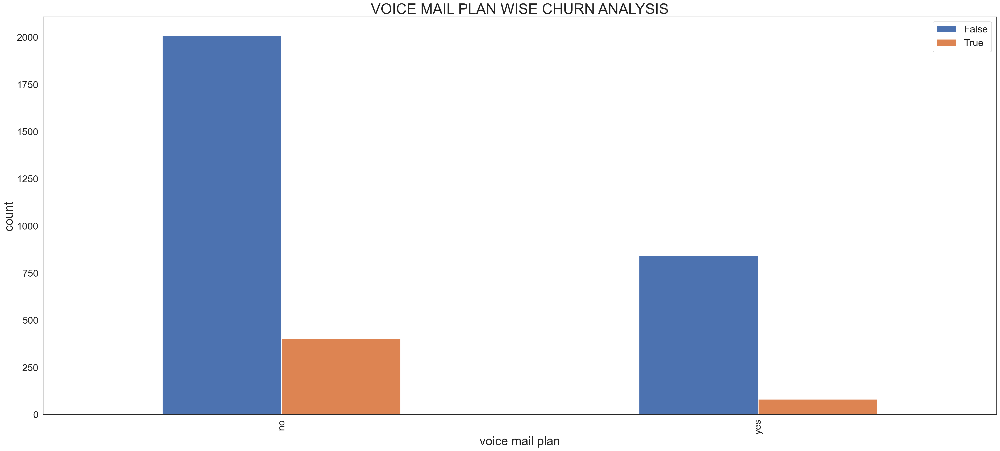

<Figure size 432x288 with 0 Axes>

In [138]:
# relational bar graph for categorical variables
for c in df_cat.columns:
    df.groupby([c , 'churn']).size().unstack(level = -1).plot(kind = 'bar' , figsize = (35,15))
    plt.xlabel(c, fontsize = 25)
    plt.ylabel('count' ,  fontsize = 25)
    plt.xticks(fontsize = 20)
    plt.yticks(fontsize = 20)
    plt.title('{X} wise Churn Analysis'.format(X=c).upper() , fontsize = 30)
    plt.legend(fontsize = 20)
    plt.show()
    plt.savefig('{X}.png'.format(X=c).upper())

- Maryland, New Jersey, and Texas have the highest churn rates. Alaska & Hawaii had the lowest churn rate. But there isn't a clear reason why certain states perform better than others

- `international plan` contains a similar number of 'yes's despite the much greater number of False-churns from the data. This could be an idication that customers with True-churn are more likely to have an international plan. This could mean that international is a good predictor of churn.

- `voice mail plan` appears to be similar across churn despite the unbalanced data, and is likely not a good predictor of churn.

In [15]:
num_vmail = df.groupby('number vmail messages')['churn'].value_counts(normalize=True)
num_vmail = pd.DataFrame(num_vmail)
num_vmail.columns = ['value']
num_vmail = num_vmail.reset_index()

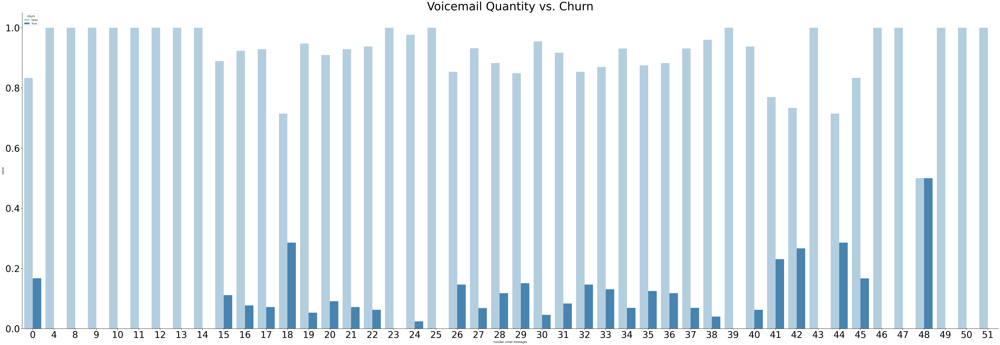

In [16]:
sns.catplot(data = num_vmail, kind = 'bar', x = 'number vmail messages', y = 'value', 
            hue = 'churn', palette = 'Blues', alpha=1, height=20, aspect=3 , legend_out = False, )
plt.title('Voicemail Quantity vs. Churn', fontsize = 50);
plt.xticks(fontsize = 40);
plt.yticks(fontsize = 40);

- Customers who got more voicemail messages tended to churn more then customers who got less, however, this relationship is not perfectly defined.

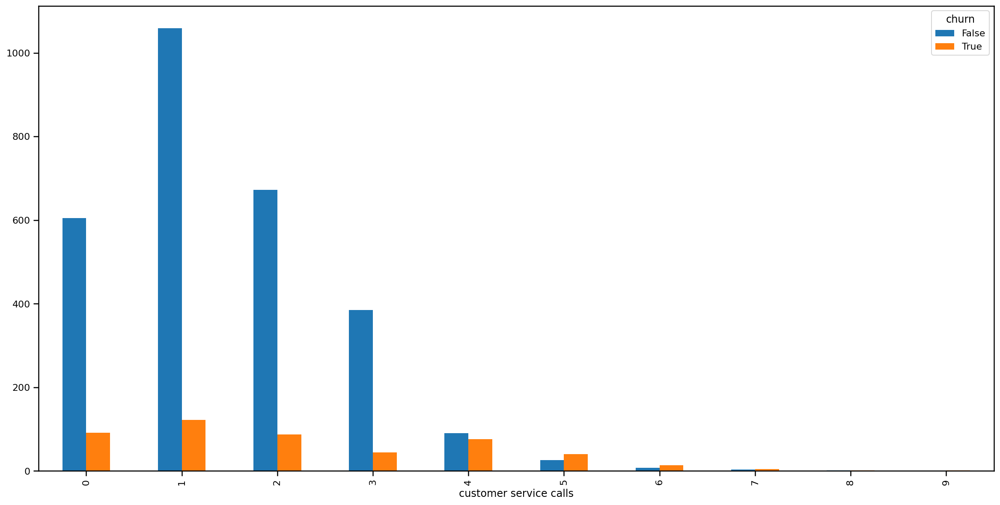

In [17]:
df.groupby(['customer service calls' , 'churn']).size().unstack(level = -1).plot(kind = 'bar' , 
                                                                                 figsize = (20,10));


In [18]:
customer_service_calls =round(df.groupby('customer service calls')['churn'].value_counts(normalize = True),2)
customer_service_calls

customer service calls  churn
0                       False    0.87
                        True     0.13
1                       False    0.90
                        True     0.10
2                       False    0.89
                        True     0.11
3                       False    0.90
                        True     0.10
4                       False    0.54
                        True     0.46
5                       True     0.61
                        False    0.39
6                       True     0.64
                        False    0.36
7                       True     0.56
                        False    0.44
8                       False    0.50
                        True     0.50
9                       True     1.00
Name: churn, dtype: float64

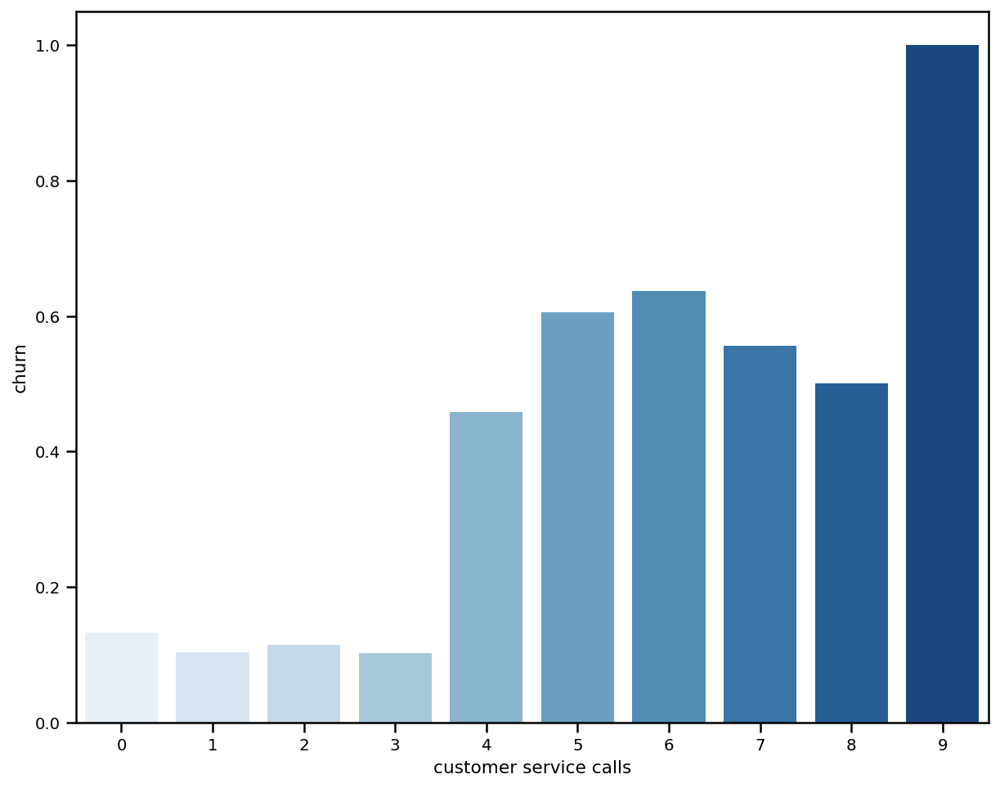

In [19]:
sns.set_context('notebook', font_scale = 0.9)
plt.figure(figsize=(10, 8))
sns.barplot(x='customer service calls', y='churn', data=df, palette = 'Blues' , ci=None);

It seems like the greater the number of customer service calls there are the greater likelihood of churn. It looks like once people hit 3 calls, thats when there was a significant rise of customer churn. So 3 calls could be considered as a warning thresold for the company. We will definitely use this column in modeling as there seems to be a distinct relationship.

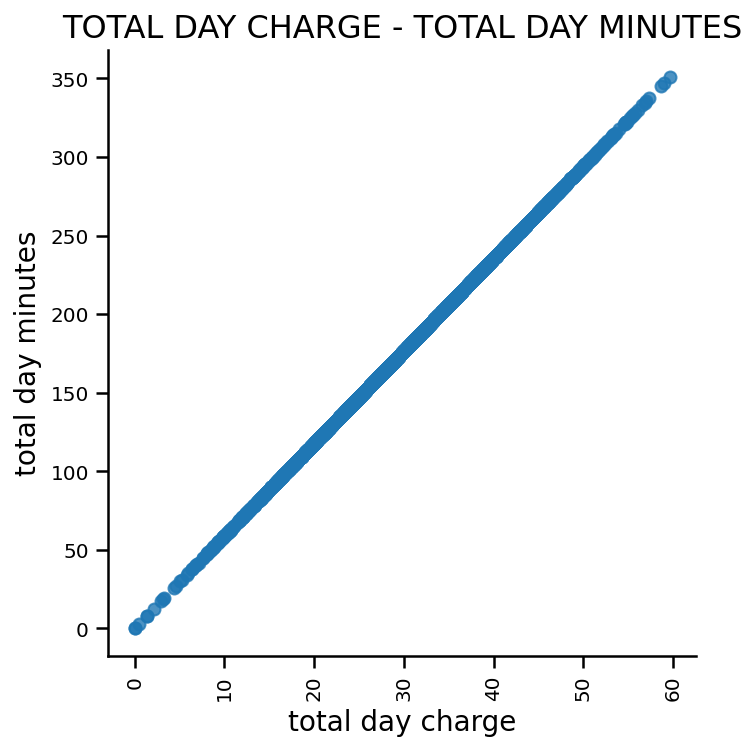

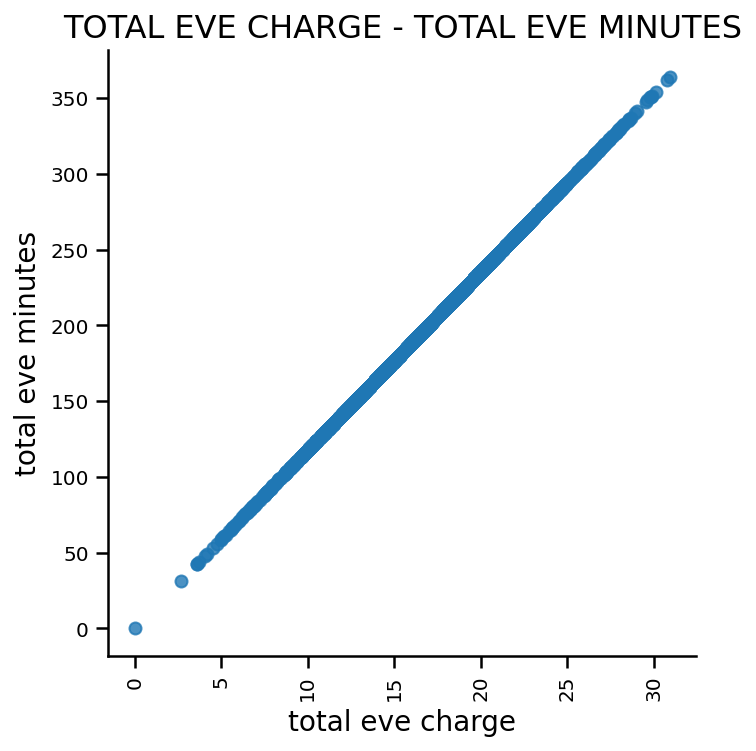

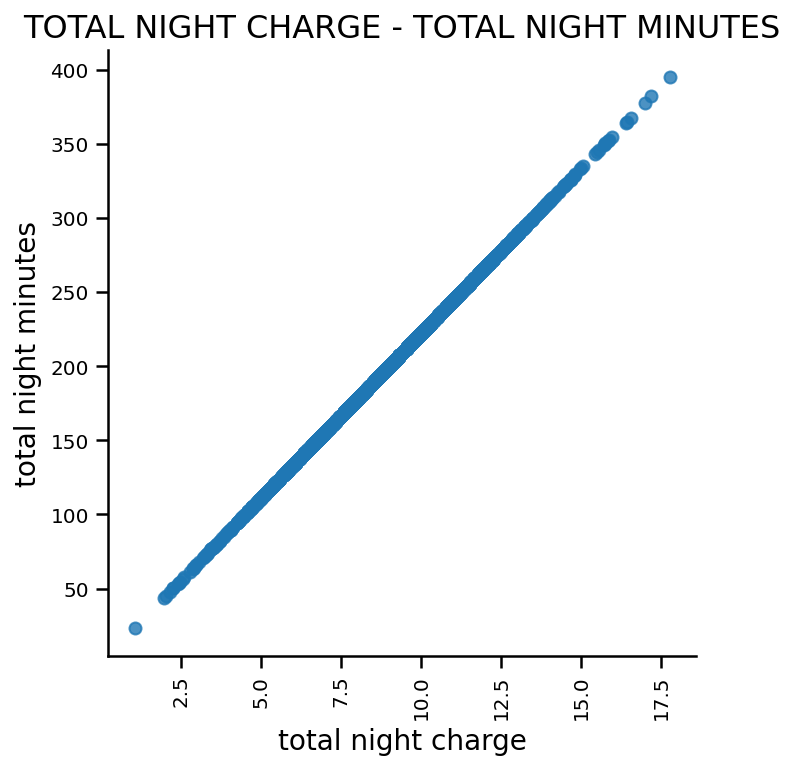

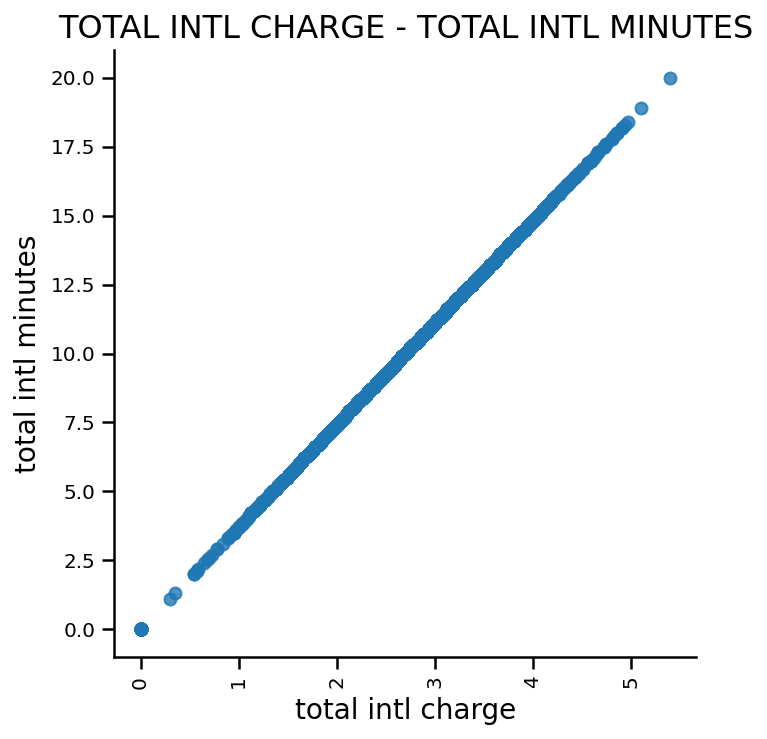

In [20]:
df_charge = df[['total day charge','total eve charge' , 'total night charge' ,'total intl charge']]
df_min = df[['total day minutes', 'total eve minutes' , 'total night minutes' , 'total intl minutes']]

# relational scatter graph for continuous variables
for c ,m  in zip(df_charge , df_min):
#     fig = plt.figure();
    fig = sns.lmplot(c,m, data=df,fit_reg=False);
    plt.xlabel(c,fontsize= 14);
    plt.ylabel(m,fontsize= 14);
    plt.xticks(fontsize=10, rotation=90);
    plt.yticks(fontsize=10);
    plt.title("{X} - {Y}".format(X=c,Y=m).upper(),fontsize = 16);
    plt.show();


### Feature Engineering

In [21]:
# Create new feature adding together all 'charge' categories for a new 'total charge' column
df['total charge'] = (df['total day charge'] + df['total eve charge'] + df['total night charge'] + df['total intl charge'])

In [22]:
df.groupby('churn').mean().reset_index()

,churn,account length,number vmail messages,total day minutes,total day calls,total day charge,total eve minutes,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,total charge
0,False,100.793684,8.604561,175.175754,100.283158,29.780421,199.043298,100.038596,16.918909,200.133193,100.058246,9.006074,10.158877,4.532982,2.743404,1.449825,58.448807
1,True,102.664596,5.115942,206.914079,101.335404,35.175921,212.410145,100.561077,18.054969,205.231677,100.399586,9.235528,10.700000,4.163561,2.889545,2.229814,65.355963


In [23]:
# yorum yap

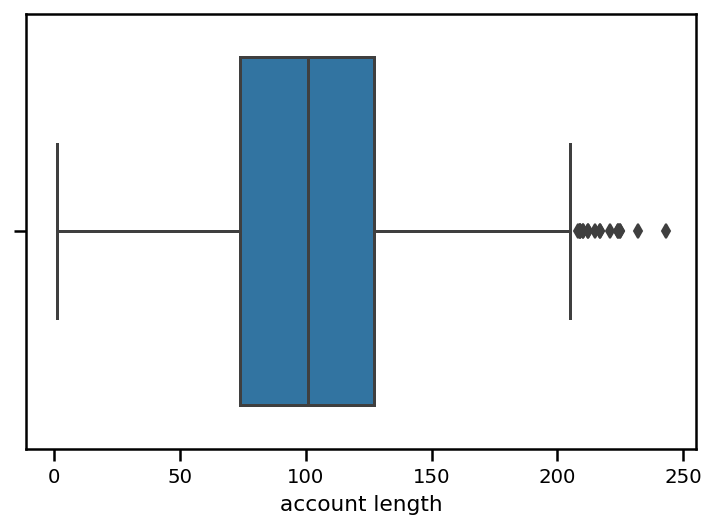

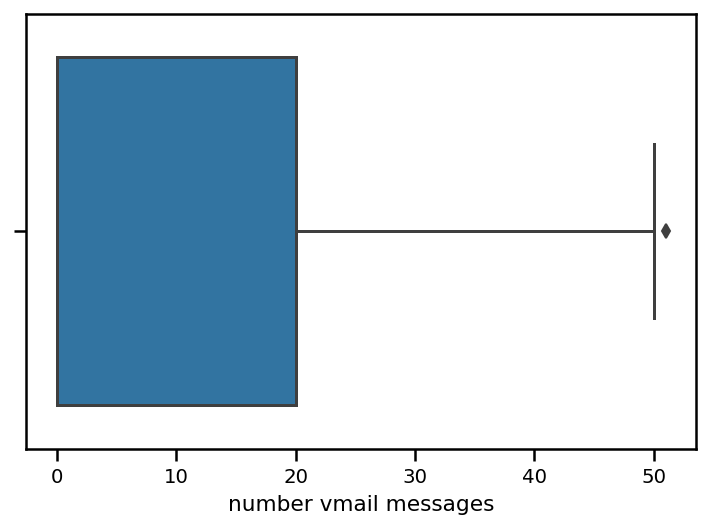

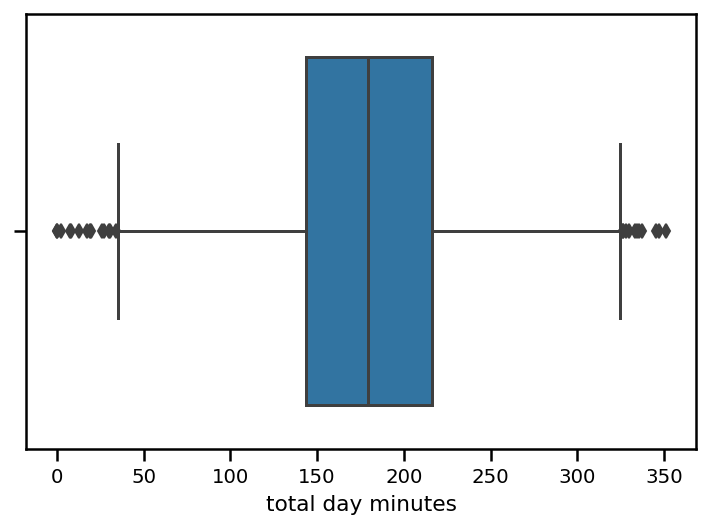

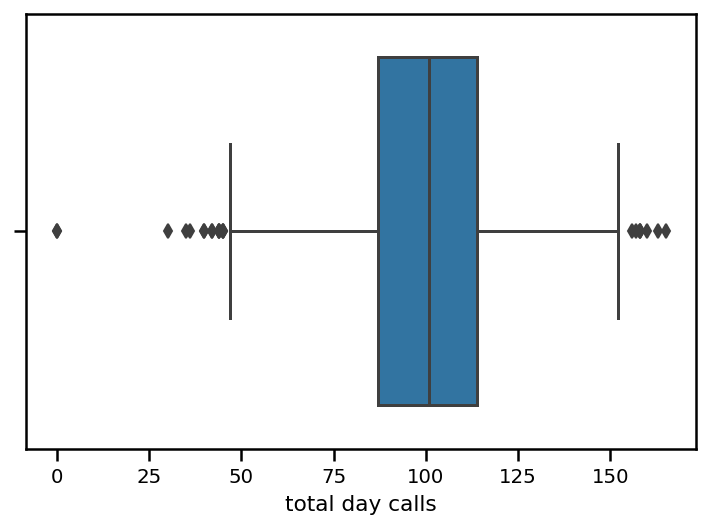

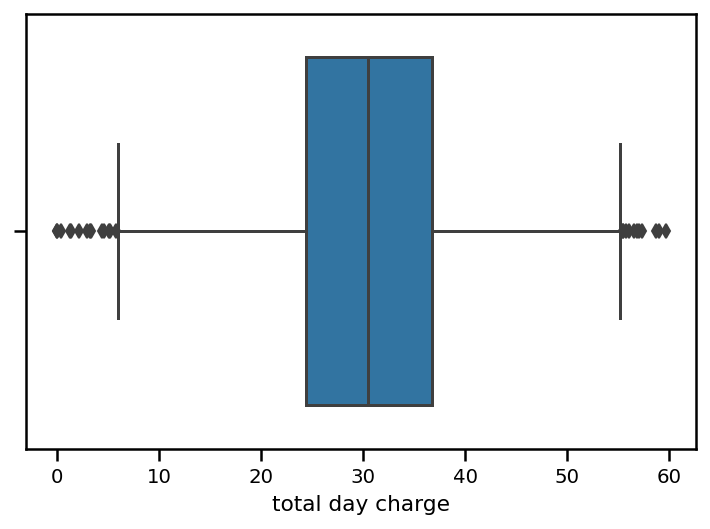

...

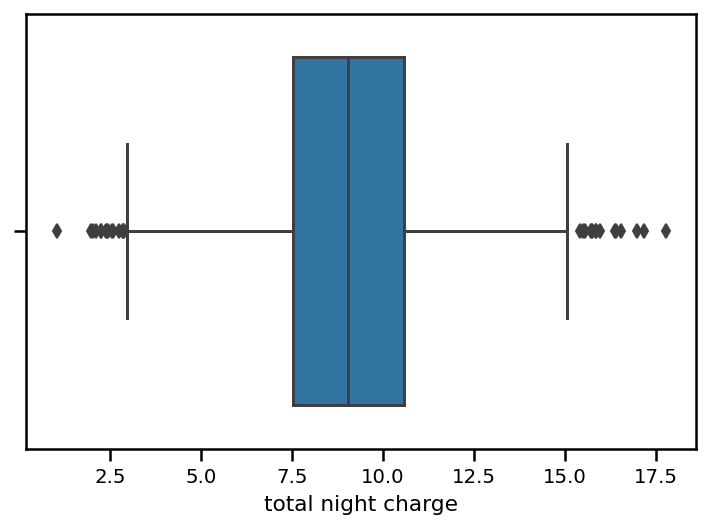

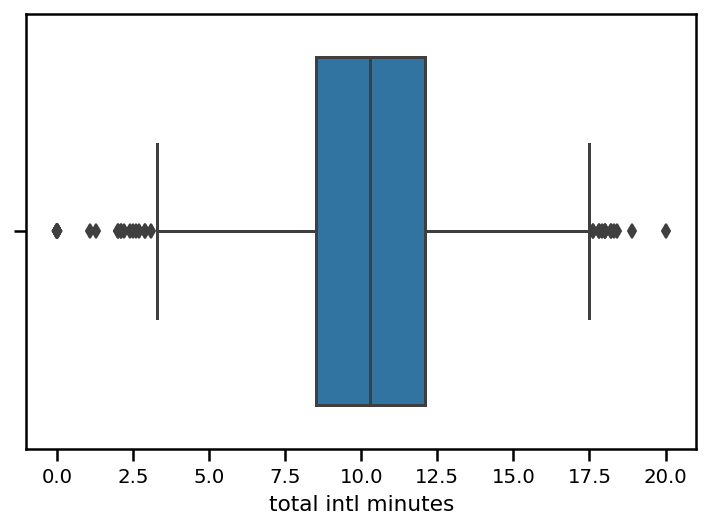

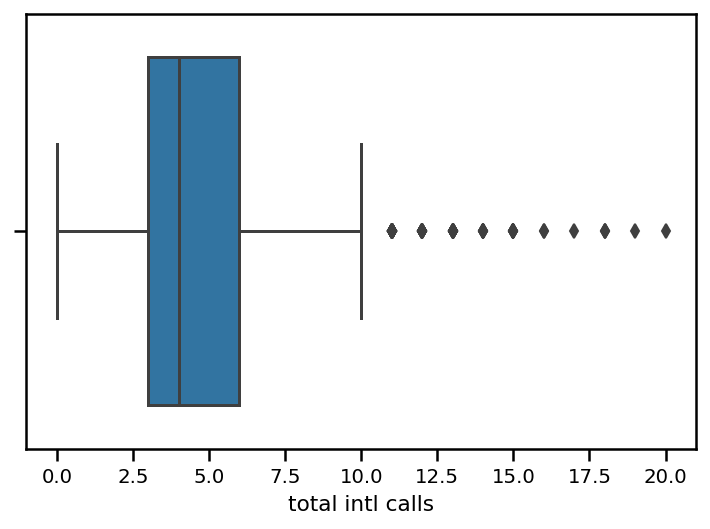

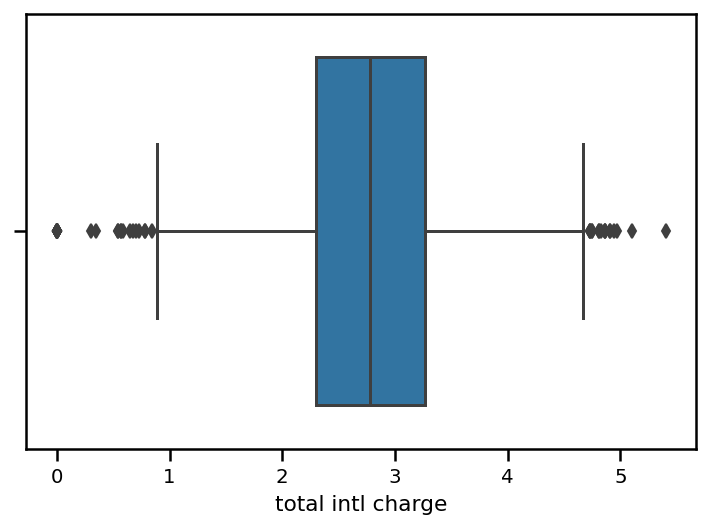

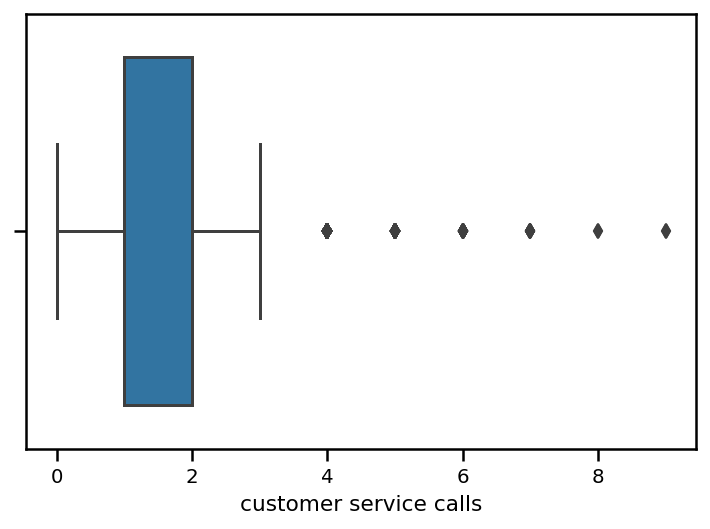

In [24]:
for i in df_cont.columns:
    plt.figure()
    sns.boxplot(df_cont[i])
    plt.show()


In [25]:
for i in df_cont.columns:
    q75, q25 = np.percentile(df_cont.loc[:,i], [75 ,25])
    iqr = q75 - q25
    lower = q25 - (iqr*1.5)
    upper = q75 + (iqr*1.5)
    lower_outliers = len(df_cont.loc[df_cont.loc[:,i] < lower,i])
    upper_outliers = len(df_cont.loc[df_cont.loc[:,i] > upper,i])
    print('{columns} ---> {X}  outliers'.format(columns = i, X = (upper_outliers + lower_outliers)))


account length ---> 18  outliers
number vmail messages ---> 1  outliers
total day minutes ---> 25  outliers
total day calls ---> 23  outliers
total day charge ---> 25  outliers
total eve minutes ---> 24  outliers
total eve calls ---> 20  outliers
total eve charge ---> 24  outliers
total night minutes ---> 30  outliers
total night calls ---> 22  outliers
total night charge ---> 30  outliers
total intl minutes ---> 46  outliers
total intl calls ---> 78  outliers
total intl charge ---> 49  outliers
customer service calls ---> 267  outliers


### Data Preparation

In [26]:
df['voice mail plan'].value_counts()

no     2411
yes     922
Name: voice mail plan, dtype: int64

In [27]:
df['international plan'].value_counts()

no     3010
yes     323
Name: international plan, dtype: int64

In [28]:
df['churn'].value_counts()

False    2850
True      483
Name: churn, dtype: int64

In [29]:
# converting columns with catgeorical information such as churn, internation plan, and voicemail plan to 0 & 1.
df['vmail plan'] = df['voice mail plan'].map(lambda x:1 if x == 'yes' else 0)
df['int_plan'] = df['international plan'].map(lambda x:1 if x == 'yes' else 0)
df['churn_'] = df['churn'].map(lambda x:1 if x == True else 0)
df = df.drop(['international plan' , 'voice mail plan' , 'churn'] , axis=1)
df.head()

,state,account length,number vmail messages,total day minutes,total day calls,total day charge,total eve minutes,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,total charge,vmail plan,int_plan,churn_
0,KS,128,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,75.56,1,0,0
1,OH,107,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,59.24,1,0,0
2,NJ,137,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,62.29,0,0,0
3,OH,84,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,66.80,0,1,0
4,OK,75,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,52.09,0,1,0


In [30]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3333 entries, 0 to 3332
Data columns (total 20 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   state                   3333 non-null   object 
 1   account length          3333 non-null   int64  
 2   number vmail messages   3333 non-null   int64  
 3   total day minutes       3333 non-null   float64
 4   total day calls         3333 non-null   int64  
 5   total day charge        3333 non-null   float64
 6   total eve minutes       3333 non-null   float64
 7   total eve calls         3333 non-null   int64  
 8   total eve charge        3333 non-null   float64
 9   total night minutes     3333 non-null   float64
 10  total night calls       3333 non-null   int64  
 11  total night charge      3333 non-null   float64
 12  total intl minutes      3333 non-null   float64
 13  total intl calls        3333 non-null   int64  
 14  total intl charge       3333 non-null   

In [31]:
#Befor start modeling I will drop columns that have multicollinearty

df.drop(['total day charge', 'total eve charge', 'total night charge', 'total intl charge'], axis =1, inplace= True)

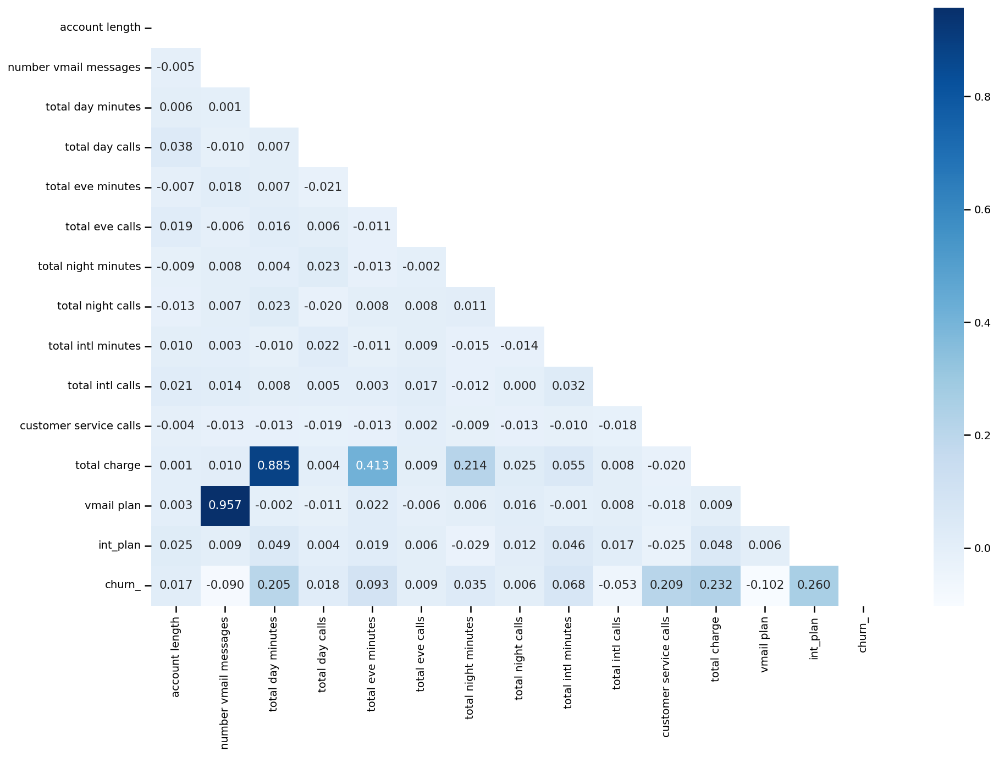

In [32]:
plt.figure(figsize = (15,10));
mask = np.triu(df.corr());
sns.heatmap(df.corr(), cmap = "Blues",annot = True, fmt = '.3f',mask = mask);

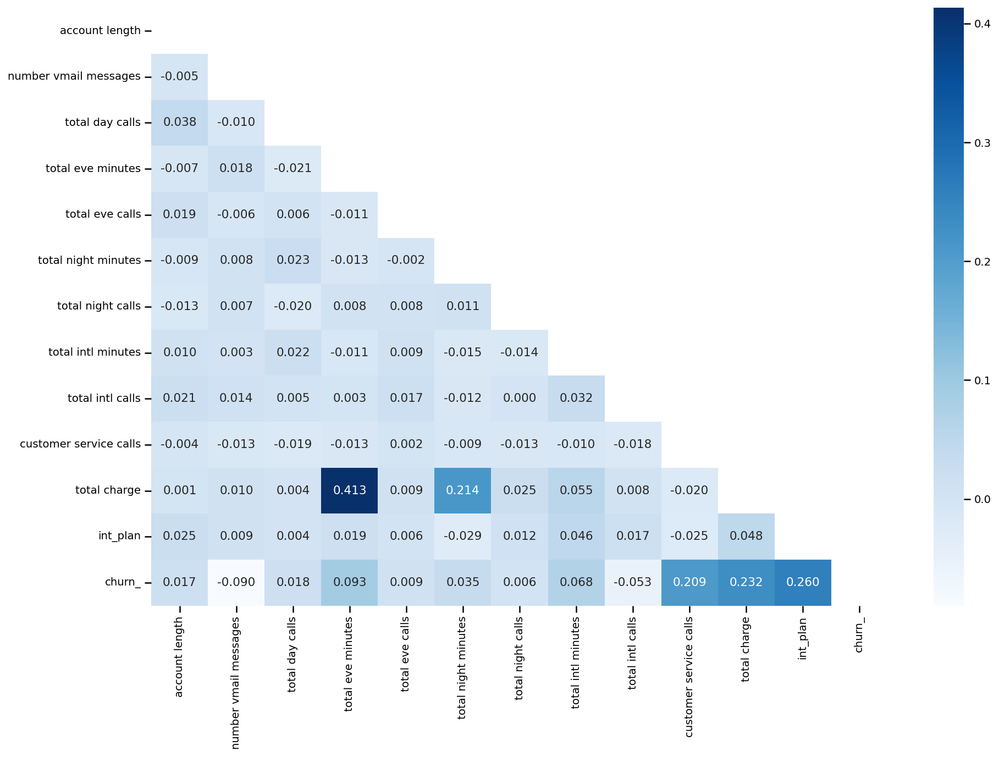

In [33]:
# voice mail plan drop yapilcak mi?
df = df.drop(['vmail plan' , 'total day minutes'] ,  axis=1)
plt.figure(figsize = (15,10));
mask = np.triu(df.corr());
sns.heatmap(df.corr(), cmap = "Blues",annot = True, fmt = '.3f',mask = mask);

In [34]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3333 entries, 0 to 3332
Data columns (total 14 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   state                   3333 non-null   object 
 1   account length          3333 non-null   int64  
 2   number vmail messages   3333 non-null   int64  
 3   total day calls         3333 non-null   int64  
 4   total eve minutes       3333 non-null   float64
 5   total eve calls         3333 non-null   int64  
 6   total night minutes     3333 non-null   float64
 7   total night calls       3333 non-null   int64  
 8   total intl minutes      3333 non-null   float64
 9   total intl calls        3333 non-null   int64  
 10  customer service calls  3333 non-null   int64  
 11  total charge            3333 non-null   float64
 12  int_plan                3333 non-null   int64  
 13  churn_                  3333 non-null   int64  
dtypes: float64(4), int64(9), object(1)
memor

### Spliting Data into Training and Test sets

In [35]:
X = df.drop('churn_' , axis =1)
y = df['churn_']

In [36]:
X_train , X_test , y_train , y_test = train_test_split(X, y , random_state=42)
print(X_train.shape, y_train.shape)
print(X_test.shape , y_test.shape)

(2499, 13) (2499,)
(834, 13) (834,)


### Encoding States

In [37]:
ohe = OneHotEncoder(sparse=False, handle_unknown='ignore')
X_tr_cat = X_train[['state']]
X_tr_ohe = pd.DataFrame(ohe.fit_transform(X_tr_cat),columns=ohe.get_feature_names(X_tr_cat.columns), index=X_tr_cat.index)

X_tr_num = X_train.drop('state', axis = 1)
X_tr = X_tr_num.join(X_tr_ohe)
X_tr.head()


,account length,number vmail messages,total day calls,total eve minutes,total eve calls,total night minutes,total night calls,total intl minutes,total intl calls,customer service calls,...,state_SD,state_TN,state_TX,state_UT,state_VA,state_VT,state_WA,state_WI,state_WV,state_WY
367,45,0,127,253.4,108,255.0,100,18.0,3,1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3103,115,0,111,227.0,108,313.2,113,13.2,1,2,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
549,121,31,63,205.6,117,196.7,85,10.1,5,4,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2531,180,0,134,180.5,113,184.2,87,10.1,4,1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2378,112,0,122,164.5,94,140.3,101,12.6,7,3,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [38]:
X_tr.shape

(2499, 63)

In [39]:
y_train.shape

(2499,)

In [40]:
X_test_cat = X_test[['state']]
X_test_ohe = pd.DataFrame(ohe.fit_transform(X_test_cat),columns=ohe.get_feature_names(X_test_cat.columns), 
                          index=X_test_cat.index)

X_test_num = X_test.drop('state', axis = 1)
X_te = X_test_num.join(X_test_ohe)
X_te.head()


,account length,number vmail messages,total day calls,total eve minutes,total eve calls,total night minutes,total night calls,total intl minutes,total intl calls,customer service calls,...,state_SD,state_TN,state_TX,state_UT,state_VA,state_VT,state_WA,state_WI,state_WV,state_WY
438,113,0,93,330.6,106,189.4,123,13.5,3,1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2674,67,0,117,217.4,124,188.4,141,12.8,6,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1345,98,0,0,159.6,130,167.1,88,6.8,1,4,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1957,147,0,79,204.1,91,156.2,113,10.2,2,1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2148,96,0,102,224.7,73,227.7,91,10.0,7,1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [41]:
X_te.shape

(834, 63)

In [42]:
y_test.shape

(834,)

### Smote Imbalanced Data

In [43]:
#SMOTE(Synthetic Minority Over-sampling Technique)
#Before smote y_train
y_train.value_counts()

0    2141
1     358
Name: churn_, dtype: int64

In [44]:
y_test.value_counts()

0    709
1    125
Name: churn_, dtype: int64

In [45]:
smote = SMOTE(random_state=42)
X_tr_sm, y_tr_sm = smote.fit_resample(X_tr,y_train)
X_tr_sm.shape , y_tr_sm.shape

((4282, 63), (4282,))

In [46]:
y_tr_sm.value_counts()

0    2141
1    2141
Name: churn_, dtype: int64

### Scaling Data

In [47]:
X_tr_sm.head()

,account length,number vmail messages,total day calls,total eve minutes,total eve calls,total night minutes,total night calls,total intl minutes,total intl calls,customer service calls,...,state_SD,state_TN,state_TX,state_UT,state_VA,state_VT,state_WA,state_WI,state_WV,state_WY
0,45,0,127,253.4,108,255.0,100,18.0,3,1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,115,0,111,227.0,108,313.2,113,13.2,1,2,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,121,31,63,205.6,117,196.7,85,10.1,5,4,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,180,0,134,180.5,113,184.2,87,10.1,4,1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,112,0,122,164.5,94,140.3,101,12.6,7,3,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [48]:
# Scale testing and training features
scaler = StandardScaler()
scaler.fit(X_tr_sm)
X_tr_sm_scaled = scaler.transform(X_tr_sm)
X_tr_sm_scaled= pd.DataFrame(X_tr_sm_scaled, columns=X_tr_sm.columns)
X_test_scaled = scaler.transform(X_te)
X_test_scaled = pd.DataFrame(X_test_scaled , columns = X_te.columns)

## Metric to use : Recall or Precision

- Precision: Of all the users that the algorithm predicts will churn, how many of them do actually churn?



It might have become obvious that precision and churn are inversely related. For instance, if an algorithm predicts that every single user will churn, it would have perfect recall. But clearly, not every user will churn from your business – and your algorithm’s precision would end up being very low, and it wouldn’t be useful for your business.

- Recall : What percentage of users that end up churning does the algorithm successfully find?

Recall would be a better metric for this dataset because with churn rate, we can implement more customer retention strategies, and misidentifying someone as cancelling and hitting them with a strategy to keep them engaged would be more beneficial than missing someone who exited and not hitting them with a strategy to keep them subscribed to the service.

## Model 1 : Logistic Regression

Having a false negative (Type II Error) means our model is predicting that the customer isn't going to cancel but they really are. Our priority is given to the metric of `Recall`.

In [49]:
logreg = LogisticRegression()
logreg.fit(X_tr_sm_scaled, y_tr_sm)

LogisticRegression()

In [50]:
feat_import_lr = pd.DataFrame(zip(X_tr_sm_scaled.columns, logreg.coef_[0,:]),columns=['Feature', 'Importance'])
feat_import_lr.sort_values(by='Importance', key=abs, ascending=False)

,Feature,Importance
10,total charge,0.762831
9,customer service calls,0.598284
8,total intl calls,-0.404954
1,number vmail messages,-0.383928
11,int_plan,0.284495
...,...,...
41,state_NE,0.006199
61,state_WV,-0.005790
39,state_NC,0.004842
42,state_NH,0.002721


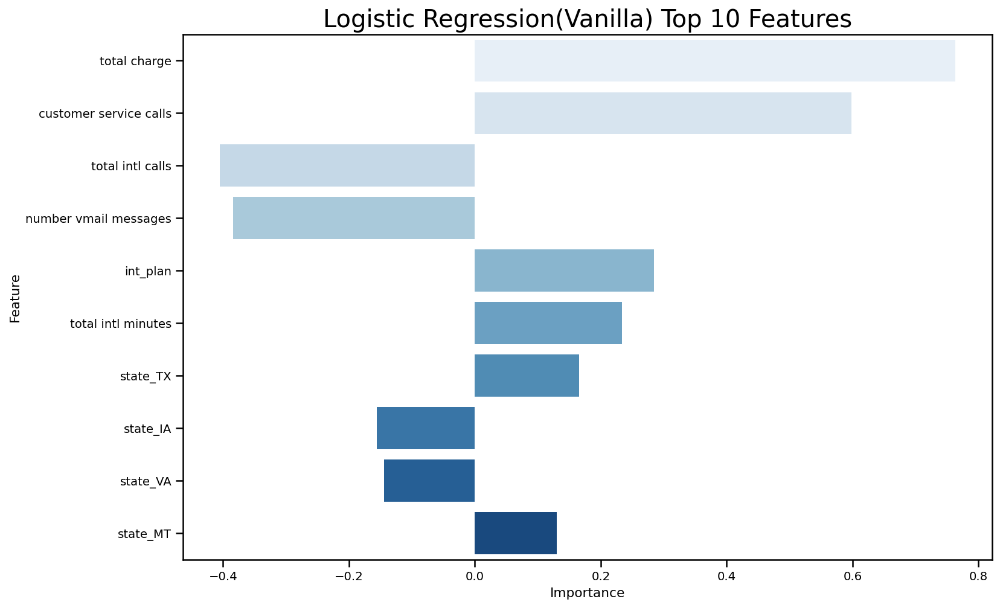

In [51]:
fig, ax = plt.subplots(figsize=(12,8))
sns.barplot(x='Importance', y='Feature', 
            data=feat_import_lr.sort_values(by='Importance', key=abs, ascending=False).head(10), orient='h', ax=ax ,
           palette='Blues');
plt.title('Logistic Regression(Vanilla) Top 10 Features' , fontdict={'fontsize' : 20});

In [52]:
y_pred = logreg.predict(X_test_scaled)

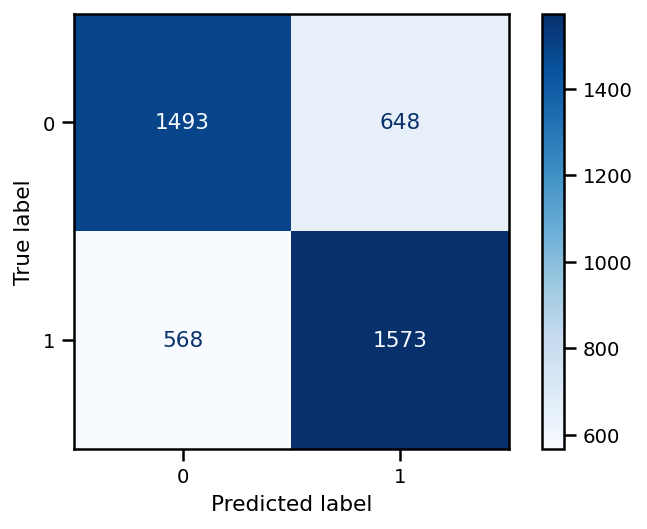

In [53]:
plot_confusion_matrix(logreg, X_tr_sm_scaled, y_tr_sm , cmap='Blues');

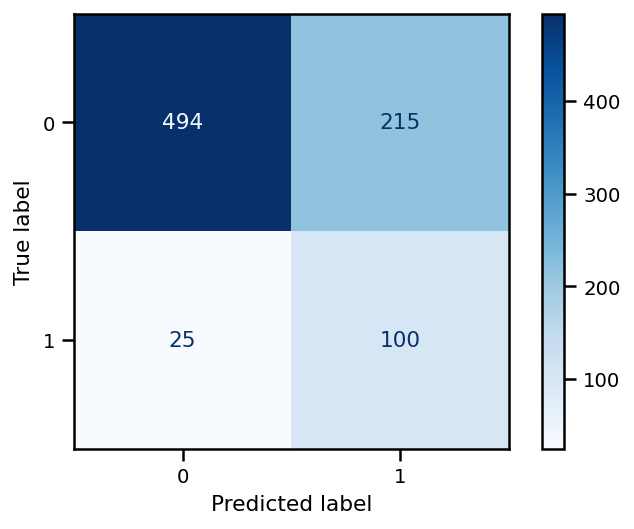

In [54]:
plot_confusion_matrix(logreg, X_test_scaled, y_test , cmap='Blues');


- We want to reduce that 25 because those are our False Negatives (Type II Error) means our model is predicting that the customer isn't going to cancel but they really are.

- According to the testing data confusion matrix, out of all the true positives,Logistic Regression predicts 100 out of 125 correctly. This would seem to indicate a `recall` score which should be reflected in the classification report.

In [55]:
print(classification_report(y_tr_sm, logreg.predict(X_tr_sm_scaled)))

              precision    recall  f1-score   support

           0       0.72      0.70      0.71      2141
           1       0.71      0.73      0.72      2141

    accuracy                           0.72      4282
   macro avg       0.72      0.72      0.72      4282
weighted avg       0.72      0.72      0.72      4282



In [56]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.95      0.70      0.80       709
           1       0.32      0.80      0.45       125

    accuracy                           0.71       834
   macro avg       0.63      0.75      0.63       834
weighted avg       0.86      0.71      0.75       834



- According to the testing data classification report Logistic Regression shows a 80% recall score for true-churn

AUC: 0.8073568406205924


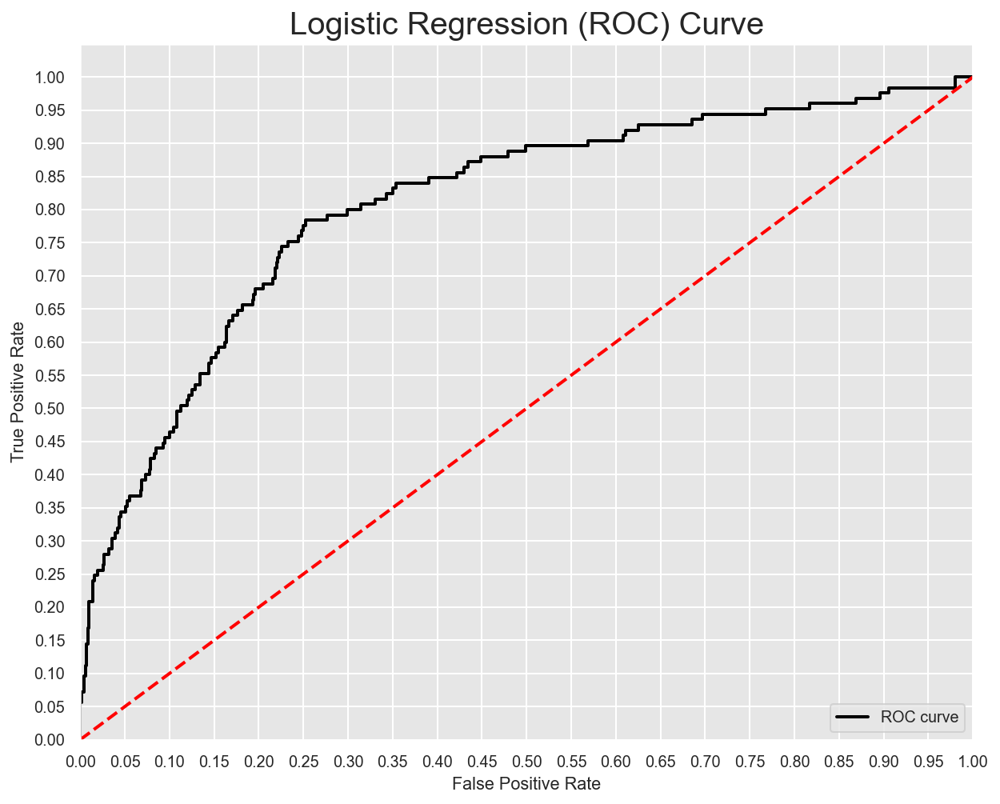

In [57]:
# Probability scores for test set
y_score = logreg.fit(X_tr_sm_scaled, y_tr_sm).decision_function(X_test_scaled)

# False positive rate and true positive rate
fpr, tpr, thresholds = roc_curve(y_test, y_score)

# Seaborn's beautiful styling
sns.set_style('darkgrid', {'axes.facecolor': '0.9'})

# Print AUC
print('AUC: {}'.format(auc(fpr, tpr)))

# Plot the ROC curve
plt.figure(figsize=(10, 8))
lw = 2
plt.plot(fpr, tpr, color = 'black',
         lw=lw, label='ROC curve')
plt.plot([0,1], [0,1], color = 'red', lw=lw, linestyle ='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0, 1.05])
plt.yticks([i/20.0 for i in range(21)])
plt.xticks([i/20.0 for i in range(21)])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Logistic Regression (ROC) Curve' , fontdict={'fontsize': 20})
plt.legend(loc='lower right')
plt.show()

In [58]:
logreg.score(X_test_scaled, y_test)

0.7122302158273381

#### Model 1 Summary:
 - Recall Score (Test Data) : 80%
 - AUC : 81%
 - Mean accuracy : 71%

## Model 2: Logistic Regression(Tuned Parameters)
### GridsearchCV

In [59]:
# Select parameter options for gridsearchcv
param_grid = [    
    {'penalty' : ['l1', 'l2', 'elasticnet'],
    'C' : np.logspace(-3,3,7),
    'solver' : ['lbfgs','newton-cg','liblinear','sag','saga'],
    'max_iter' : [100, 1000,2500, 5000]
    }]

In [60]:
clf = GridSearchCV(logreg, param_grid = param_grid, cv = 3, verbose=True, n_jobs=-1)
clf.fit(X_tr_sm_scaled, y_tr_sm)

Fitting 3 folds for each of 420 candidates, totalling 1260 fits


GridSearchCV(cv=3, estimator=LogisticRegression(), n_jobs=-1,
             param_grid=[{'C': array([1.e-03, 1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03]),
                          'max_iter': [100, 1000, 2500, 5000],
                          'penalty': ['l1', 'l2', 'elasticnet'],
                          'solver': ['lbfgs', 'newton-cg', 'liblinear', 'sag',
                                     'saga']}],
             verbose=True)

In [61]:
# Best classifer estimates
clf.best_estimator_

LogisticRegression(C=10.0, penalty='l1', solver='liblinear')

In [62]:
# Create tunned logistic regression model
logreg2 = LogisticRegression(C=10.0 , penalty='l1', solver='liblinear')
logreg2.fit(X_tr_sm_scaled, y_tr_sm)

LogisticRegression(C=10.0, penalty='l1', solver='liblinear')

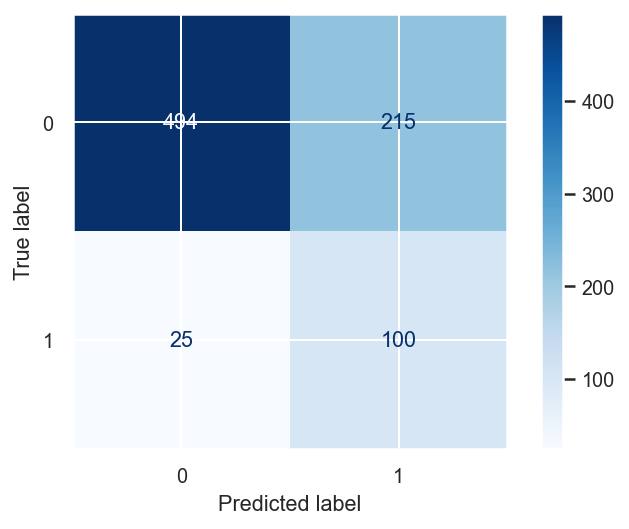

In [63]:
plot_confusion_matrix(logreg2, X_test_scaled, y_test, cmap='Blues');
sns.set_style('dark')

In [64]:
print(classification_report(y_tr_sm, logreg2.predict(X_tr_sm_scaled)))

              precision    recall  f1-score   support

           0       0.72      0.70      0.71      2141
           1       0.71      0.73      0.72      2141

    accuracy                           0.72      4282
   macro avg       0.72      0.72      0.72      4282
weighted avg       0.72      0.72      0.72      4282



In [65]:
print(classification_report(y_test, logreg2.predict(X_test_scaled)))

              precision    recall  f1-score   support

           0       0.95      0.70      0.80       709
           1       0.32      0.80      0.45       125

    accuracy                           0.71       834
   macro avg       0.63      0.75      0.63       834
weighted avg       0.86      0.71      0.75       834



AUC: 0.8074358251057828


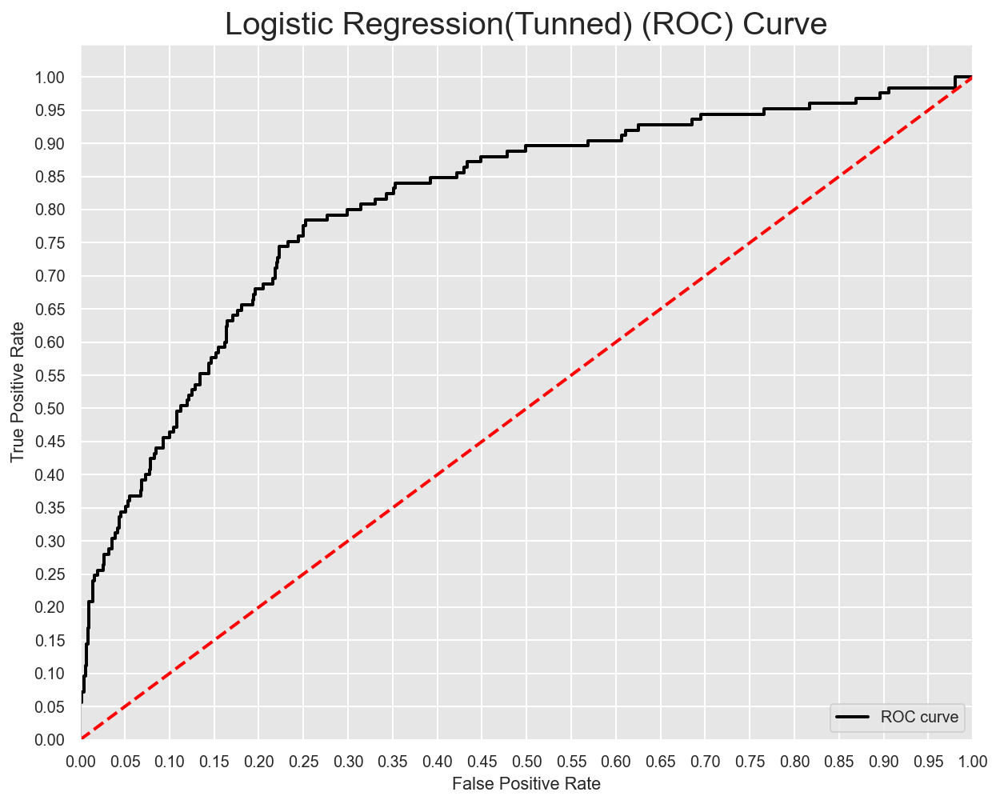

In [66]:
# Probability scores for test set
y_score = logreg2.fit(X_tr_sm_scaled, y_tr_sm).decision_function(X_test_scaled)

# False positive rate and true positive rate
fpr, tpr, thresholds = roc_curve(y_test, y_score)

# Seaborn's beautiful styling
sns.set_style('darkgrid', {'axes.facecolor': '0.9'})

# Print AUC
print('AUC: {}'.format(auc(fpr, tpr)))

# Plot the ROC curve
plt.figure(figsize=(10, 8))
lw = 2
plt.plot(fpr, tpr, color = 'black',
         lw=lw, label='ROC curve')
plt.plot([0,1], [0,1], color = 'red', lw=lw, linestyle ='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0, 1.05])
plt.yticks([i/20.0 for i in range(21)])
plt.xticks([i/20.0 for i in range(21)])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Logistic Regression(Tunned) (ROC) Curve' , fontdict={'fontsize': 20})
plt.legend(loc='lower right')
plt.show()

In [67]:
logreg2.score(X_test_scaled, y_test)

0.7122302158273381

#### Model 2 Summary:
 - Recall Score (Test Data) : 80%
 - AUC : 81%
 - Mean accuracy : 71%

## Model 3: Decision Tree

In [68]:
dt = DecisionTreeClassifier()
dt.fit(X_tr_sm_scaled , y_tr_sm)

DecisionTreeClassifier()

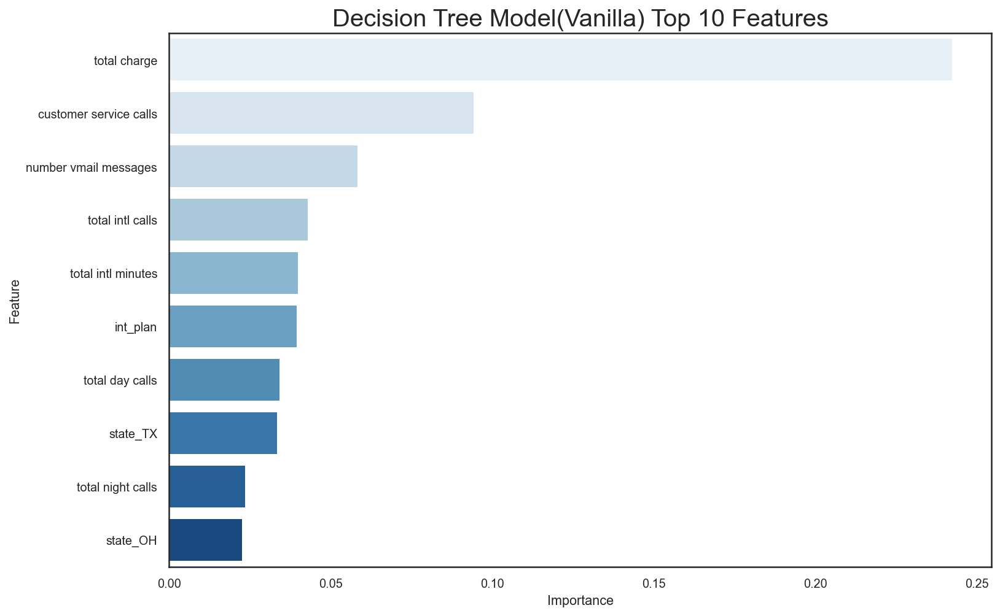

In [69]:
feat_import_df = pd.DataFrame(zip(X_tr_sm_scaled.columns, dt.feature_importances_),
                            columns=['Feature', 'Importance'])
sns.set_style('white')
fig, ax = plt.subplots(figsize=(12,8))
sns.barplot(x='Importance', y='Feature', 
            data=feat_import_df.sort_values(by='Importance', key=abs, ascending=False).head(10), orient='h', ax=ax ,
           palette = 'Blues');
plt.title('Decision Tree Model(Vanilla) Top 10 Features' , fontdict={'fontsize' : 20});


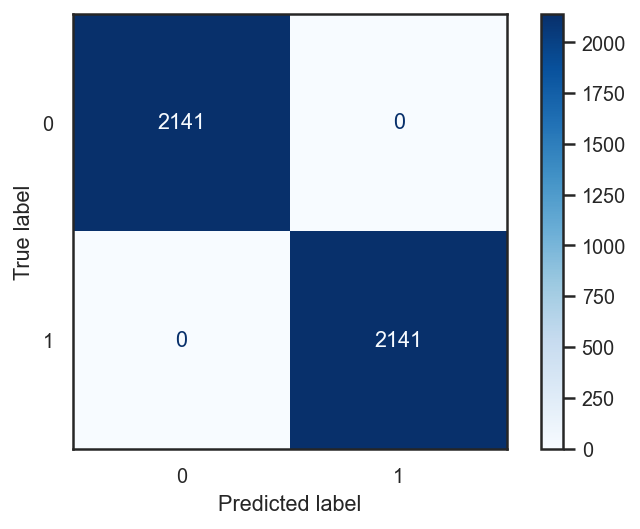

In [70]:
plot_confusion_matrix(dt , X_tr_sm_scaled , y_tr_sm , cmap='Blues');

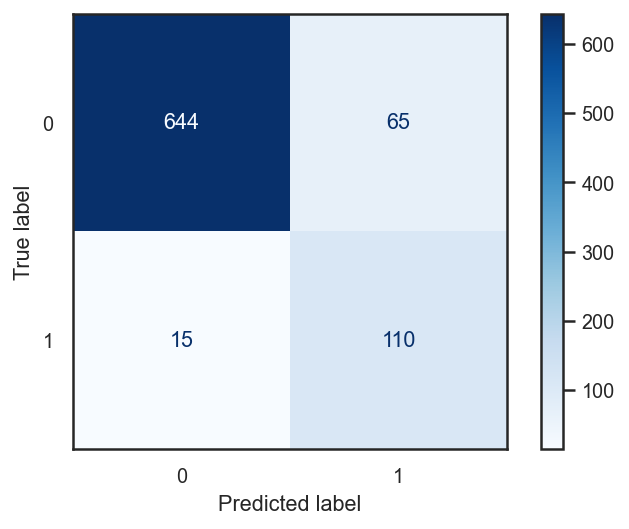

In [71]:
plot_confusion_matrix(dt, X_test_scaled, y_test , cmap='Blues');

- According to the testing data confusion matrix, out of all the true positives,Decision Tree predicts 109 out of 125 correctly. This would seem to indicate a `recall` score which should be reflected in the classification report.

In [72]:
print(classification_report(y_tr_sm, dt.predict(X_tr_sm_scaled)))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2141
           1       1.00      1.00      1.00      2141

    accuracy                           1.00      4282
   macro avg       1.00      1.00      1.00      4282
weighted avg       1.00      1.00      1.00      4282



- According to the training data classification report Decision Tree model shows 100% recall score.This would likely indicate that the model is overfitting the data and will need to tune the decision tree parameters for a more reliable model.

In [73]:
print(classification_report(y_test, dt.predict(X_test_scaled)))

              precision    recall  f1-score   support

           0       0.98      0.91      0.94       709
           1       0.63      0.88      0.73       125

    accuracy                           0.90       834
   macro avg       0.80      0.89      0.84       834
weighted avg       0.92      0.90      0.91       834



AUC: 0.8941607898448519


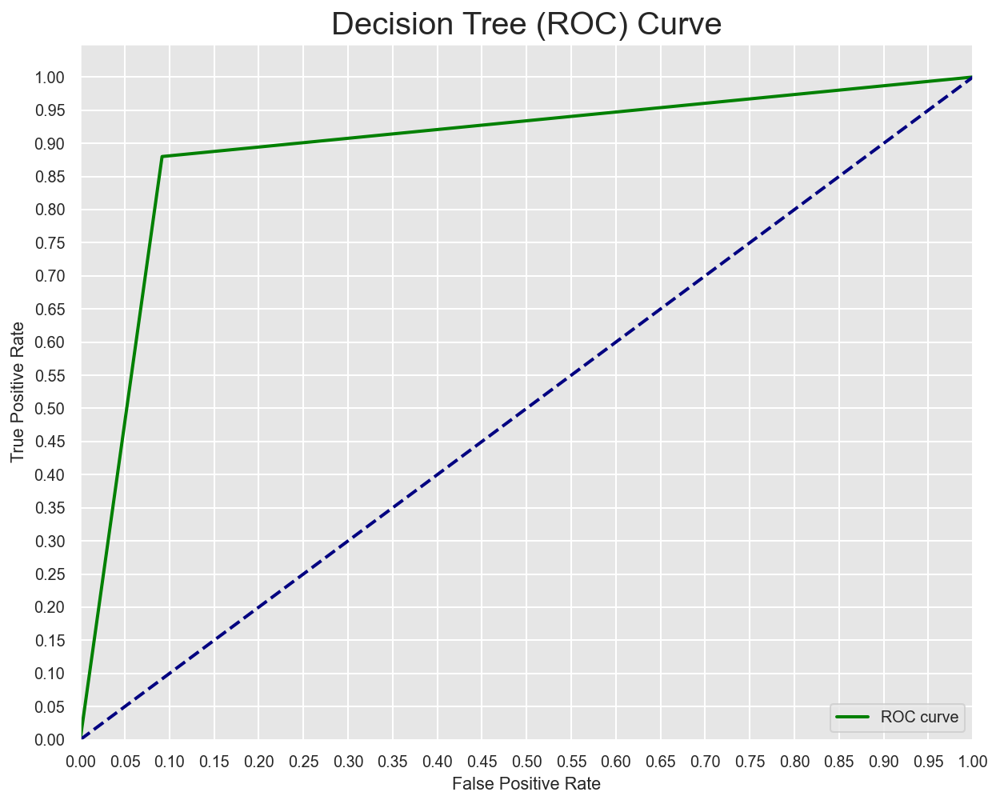

In [74]:
sns.set_style('darkgrid', {'axes.facecolor': '0.9'})
fpr, tpr, thresholds = roc_curve(y_test, dt.predict(X_test_scaled))
print('AUC: {}'.format(auc(fpr, tpr)))
plt.figure(figsize=(10, 8))
lw = 2
plt.plot(fpr, tpr, color='green',
         lw=lw, label='ROC curve')
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.yticks([i/20.0 for i in range(21)])
plt.xticks([i/20.0 for i in range(21)])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Decision Tree (ROC) Curve' , fontdict={'fontsize': 20})
plt.legend(loc='lower right')
plt.show()

In [75]:
dt.score(X_test_scaled, y_test)

0.9040767386091128

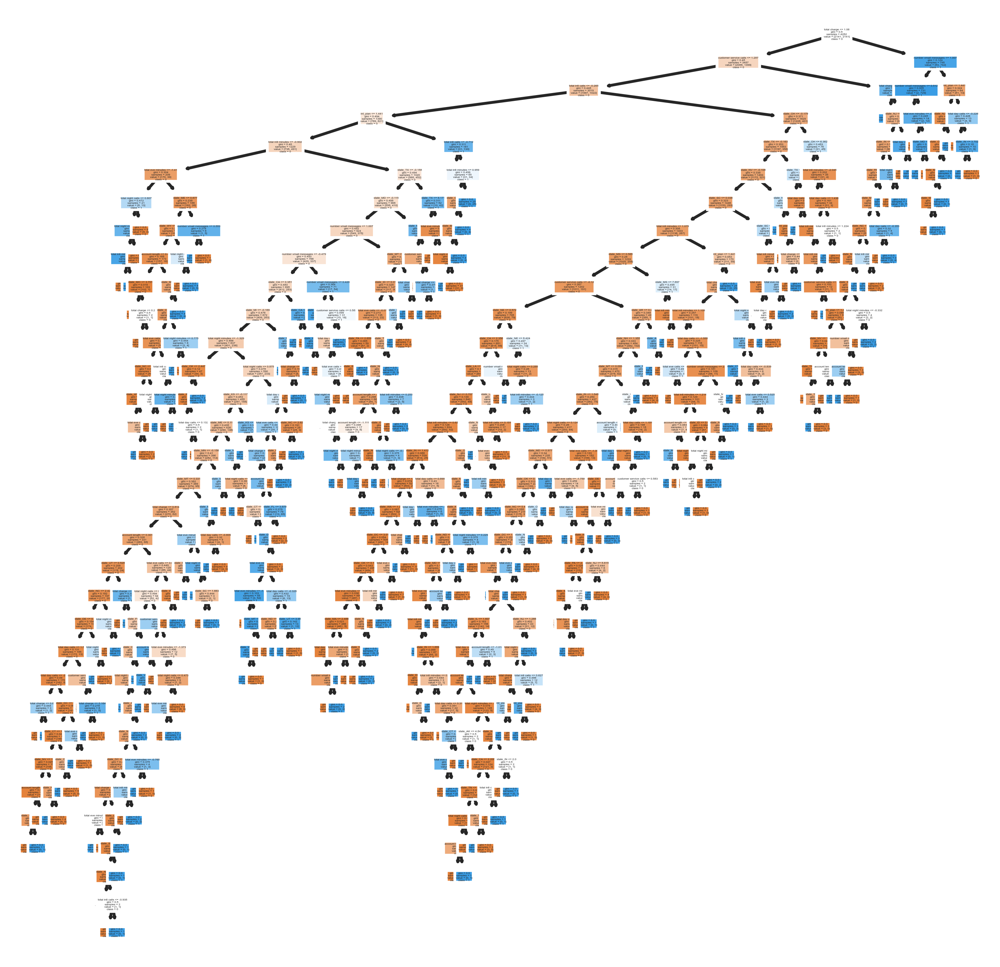

In [76]:
# Graph Decision tree
fig, axes = plt.subplots(nrows = 1,ncols = 1, figsize = (6,6), dpi=300)
tree.plot_tree(dt,
               feature_names = X_tr_sm_scaled.columns, 
               class_names=np.unique(y_tr_sm).astype('str'),
               filled = True)
plt.show()


#### Model 3 Summary:
 - Recall Score (Test Data) : 88%
 - AUC : 89%
 - Mean Accuracy : 89%

## Model 4: Decision Tree (Tuned Parameters)
### GridsearchCV

In [77]:
# Select parameter options for gridsearchcv
param_grid_dt = [    
    {'max_depth' : [1, 10, 10],
    'min_samples_split' : [1, 10, 10],
    'min_samples_leaf' : [0.1, 0.5, 5]
    }]


In [78]:
clf_dt = GridSearchCV(dt , param_grid= param_grid_dt ,cv = 3, verbose=True, n_jobs=-1 )
clf_dt.fit(X_tr_sm_scaled ,y_tr_sm)

Fitting 3 folds for each of 27 candidates, totalling 81 fits


GridSearchCV(cv=3, estimator=DecisionTreeClassifier(), n_jobs=-1,
             param_grid=[{'max_depth': [1, 10, 10],
                          'min_samples_leaf': [0.1, 0.5, 5],
                          'min_samples_split': [1, 10, 10]}],
             verbose=True)

In [79]:
clf_dt.best_estimator_

DecisionTreeClassifier(max_depth=10, min_samples_leaf=5, min_samples_split=10)

In [80]:
# Create tunned Decision Tree model

dt2 = DecisionTreeClassifier(max_depth=10 , min_samples_leaf=5 , min_samples_split=10)
dt2.fit(X_tr_sm_scaled , y_tr_sm)

DecisionTreeClassifier(max_depth=10, min_samples_leaf=5, min_samples_split=10)

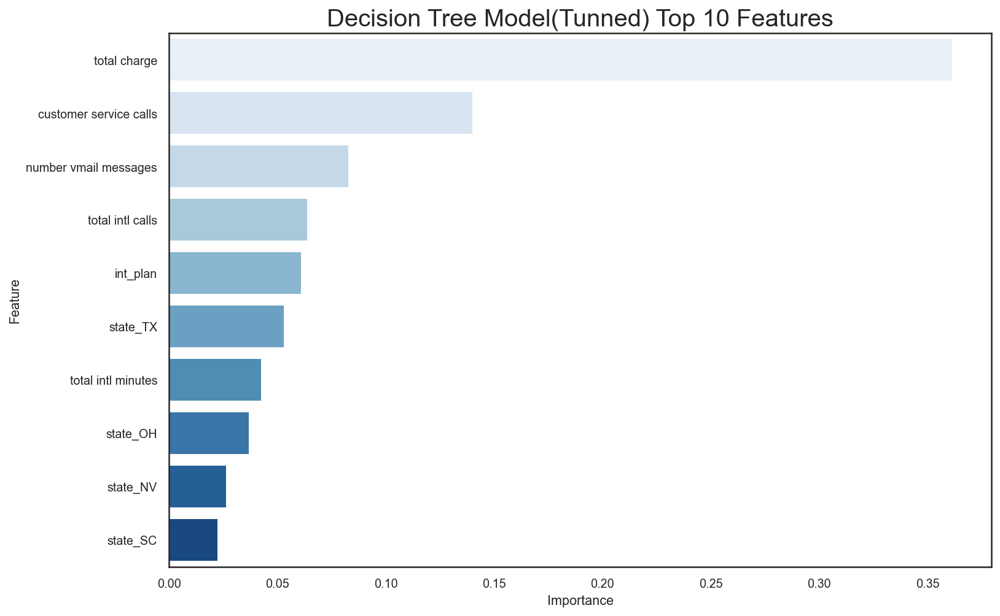

In [81]:
feat_imps_df2 = pd.DataFrame(zip(X_tr_sm_scaled.columns, dt2.feature_importances_),
                            columns=['Feature', 'Importance'])
sns.set_style('white')
fig, ax = plt.subplots(figsize=(12,8))
sns.barplot(x='Importance', y='Feature', 
            data=feat_imps_df2.sort_values(by='Importance', key=abs, ascending=False).head(10), orient='h', ax=ax ,
           palette = 'Blues');
plt.title('Decision Tree Model(Tunned) Top 10 Features' , fontdict={'fontsize' : 20});


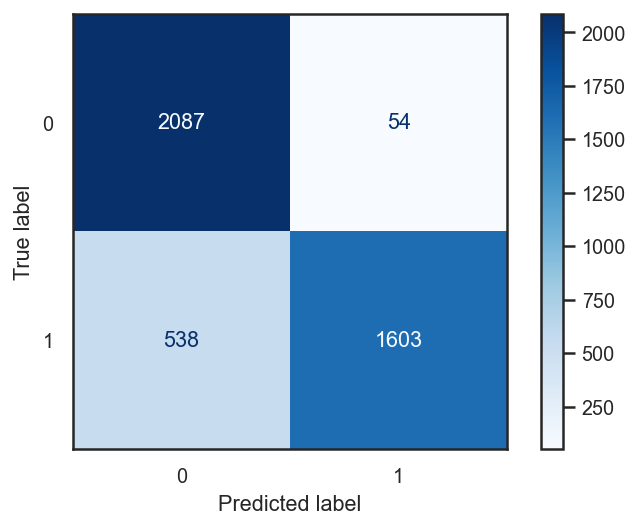

In [82]:
plot_confusion_matrix(dt2 , X_tr_sm_scaled , y_tr_sm , cmap='Blues');

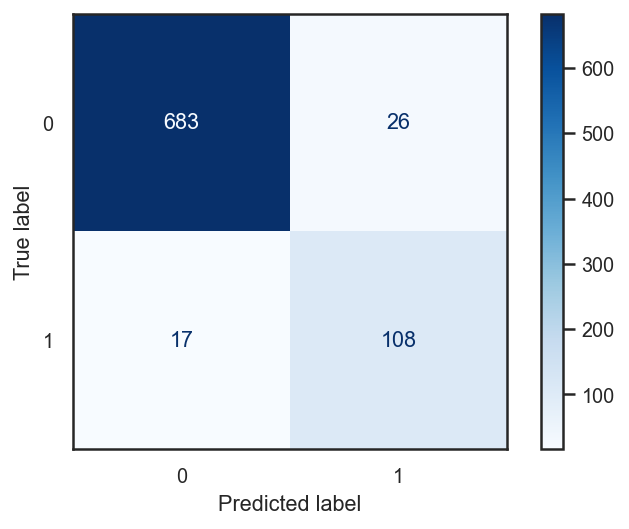

In [83]:
plot_confusion_matrix(dt2 , X_test_scaled , y_test , cmap='Blues');

In [84]:
print(classification_report(y_tr_sm , dt2.predict(X_tr_sm_scaled)))

              precision    recall  f1-score   support

           0       0.80      0.97      0.88      2141
           1       0.97      0.75      0.84      2141

    accuracy                           0.86      4282
   macro avg       0.88      0.86      0.86      4282
weighted avg       0.88      0.86      0.86      4282



In [85]:
print(classification_report(y_test , dt2.predict(X_test_scaled)))

              precision    recall  f1-score   support

           0       0.98      0.96      0.97       709
           1       0.81      0.86      0.83       125

    accuracy                           0.95       834
   macro avg       0.89      0.91      0.90       834
weighted avg       0.95      0.95      0.95       834



AUC: 0.9136643159379408


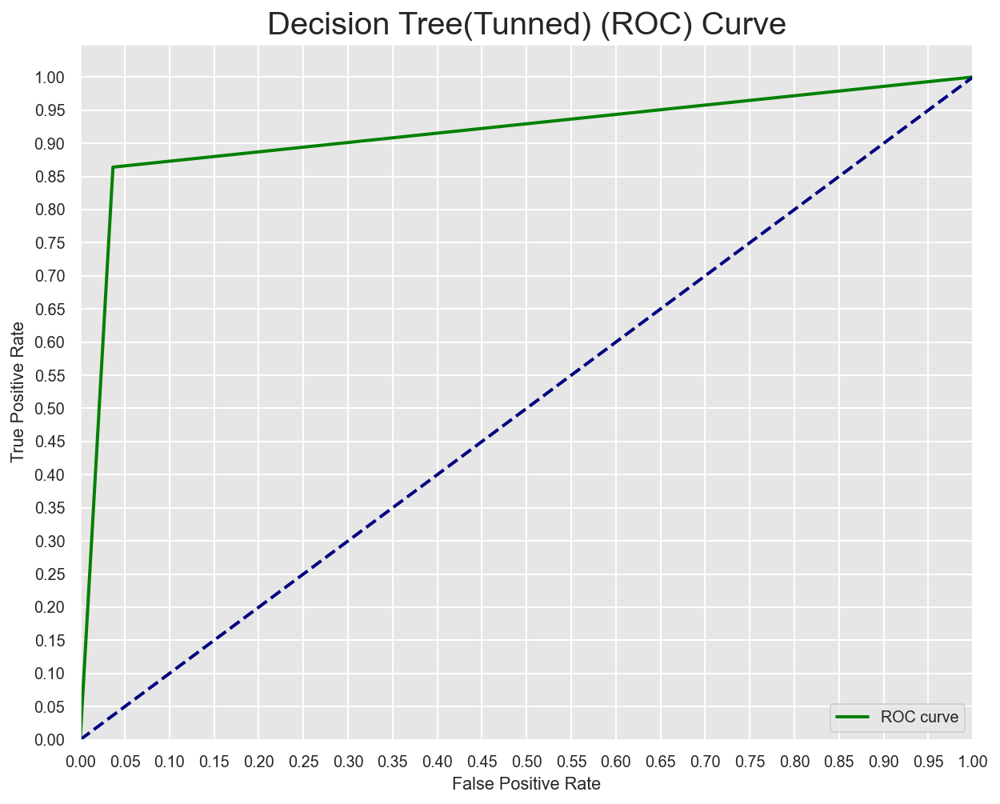

In [86]:
sns.set_style('darkgrid', {'axes.facecolor': '0.9'})
fpr, tpr, thresholds = roc_curve(y_test, dt2.predict(X_test_scaled))
print('AUC: {}'.format(auc(fpr, tpr)))
plt.figure(figsize=(10, 8))
lw = 2
plt.plot(fpr, tpr, color='green',
         lw=lw, label='ROC curve')
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.yticks([i/20.0 for i in range(21)])
plt.xticks([i/20.0 for i in range(21)])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Decision Tree(Tunned) (ROC) Curve' , fontdict={'fontsize': 20})
plt.legend(loc='lower right')
plt.show()

In [87]:
dt2.score(X_test_scaled, y_test)

0.9484412470023981

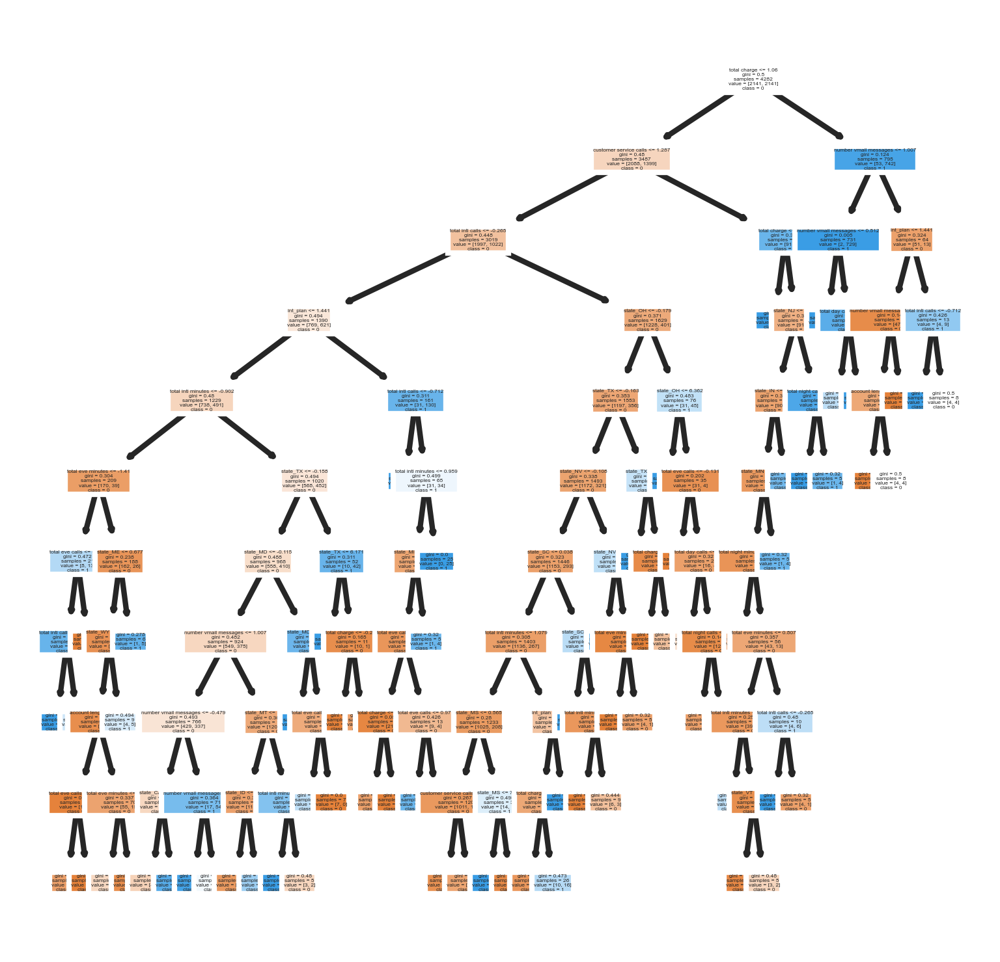

In [88]:
# Graph Decision tree
fig, axes = plt.subplots(nrows = 1,ncols = 1, figsize = (3,3), dpi=300)
tree.plot_tree(dt2,
               feature_names = X_tr_sm_scaled.columns, 
               class_names=np.unique(y_tr_sm).astype('str'),
               filled = True)
plt.show()


- Parametre tunned Decision Tree Model does not appear to be overfitting based.

#### Model 4 Summary:
- Recall Score (Test Data) : 86%
- AUC : 92%
- Mean Accuracy : 95%

## Model 5: Random Forest

In [89]:
rf = RandomForestClassifier(random_state=42)
rf.fit(X_tr_sm_scaled , y_tr_sm)

RandomForestClassifier(random_state=42)

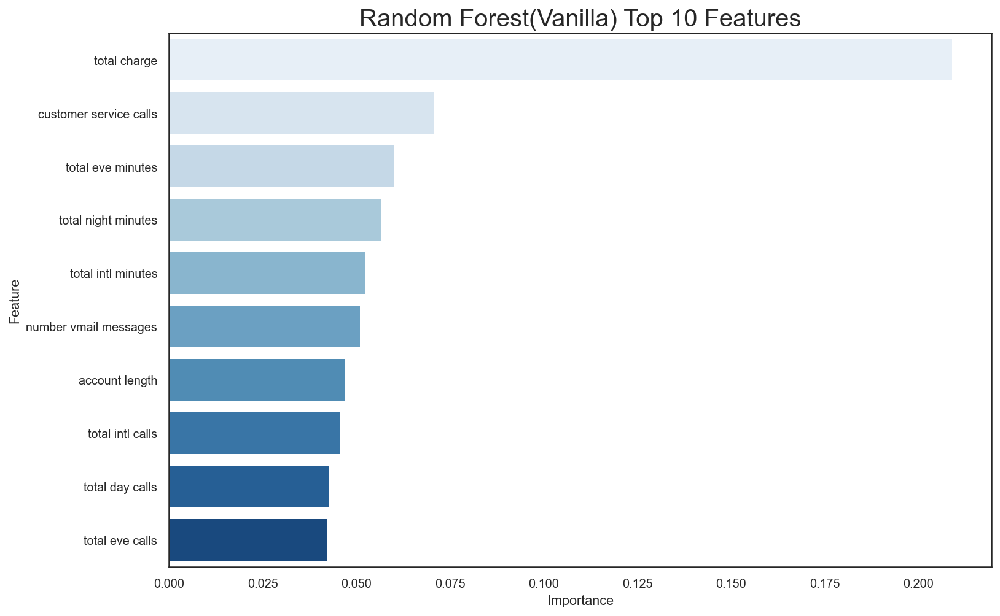

In [90]:
feat_import_rf = pd.DataFrame(zip(X_tr_sm_scaled.columns, rf.feature_importances_),
                              columns=['Feature', 'Importance'])
sns.set_style('white')
fig, ax = plt.subplots(figsize=(12,8))
sns.barplot(x='Importance', y='Feature',
            data=feat_import_rf.sort_values(by='Importance', ascending=False).head(10), orient='h',
            ax=ax, palette = 'Blues');
plt.title('Random Forest(Vanilla) Top 10 Features' , fontdict={'fontsize' : 20});

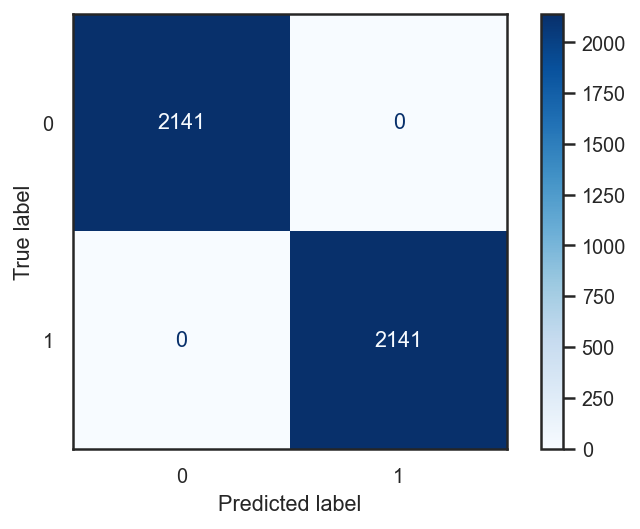

In [91]:
plot_confusion_matrix(rf , X_tr_sm_scaled , y_tr_sm , cmap= 'Blues');
sns.set_style('dark')

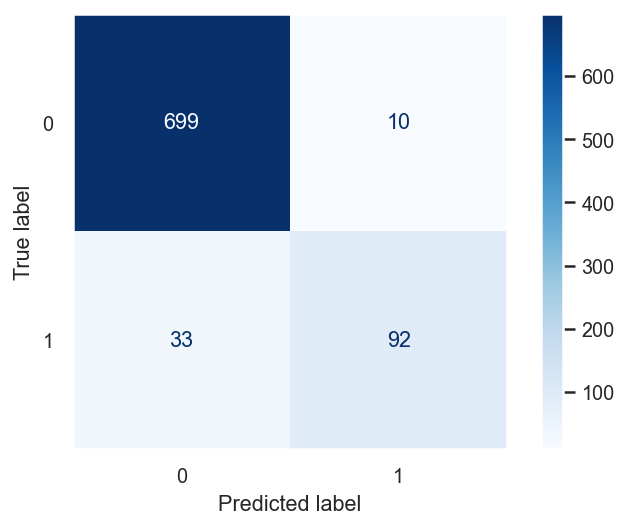

In [92]:
plot_confusion_matrix(rf , X_test_scaled , y_test , cmap= 'Blues');

In [93]:
print(classification_report(y_tr_sm , rf.predict(X_tr_sm_scaled)))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2141
           1       1.00      1.00      1.00      2141

    accuracy                           1.00      4282
   macro avg       1.00      1.00      1.00      4282
weighted avg       1.00      1.00      1.00      4282



- Random Forest Model appears to be overfitting based on perfect training data results

In [94]:
print(classification_report(y_test , rf.predict(X_test_scaled)))

              precision    recall  f1-score   support

           0       0.95      0.99      0.97       709
           1       0.90      0.74      0.81       125

    accuracy                           0.95       834
   macro avg       0.93      0.86      0.89       834
weighted avg       0.95      0.95      0.95       834



AUC: 0.8609478138222849


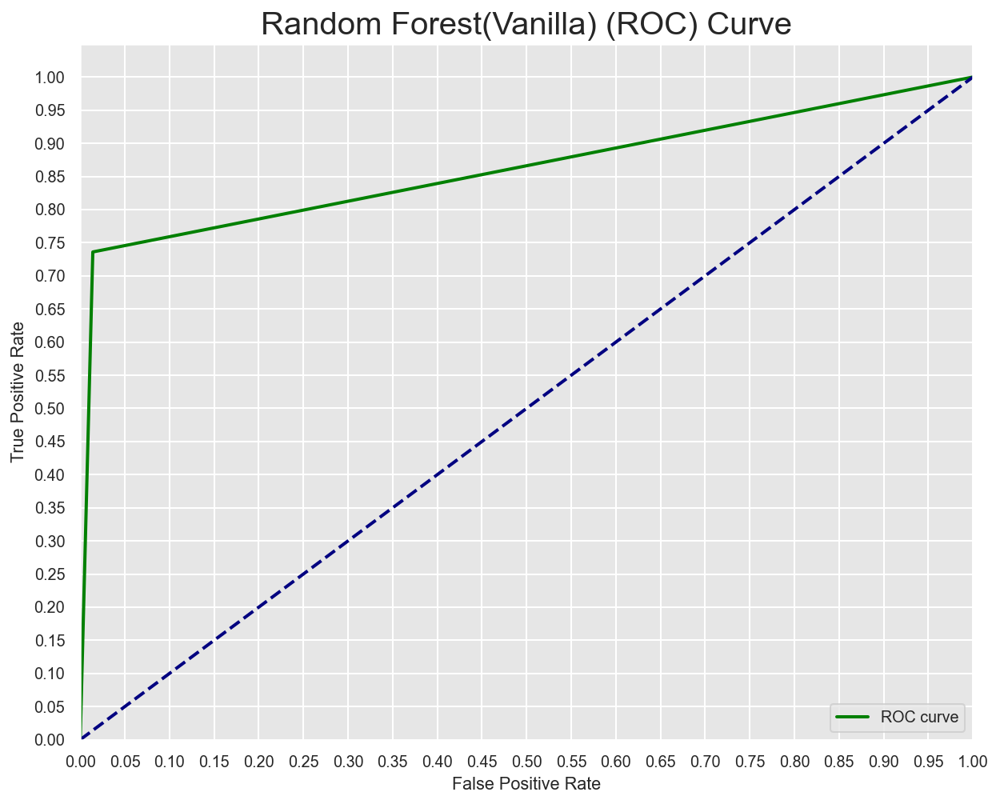

In [95]:
sns.set_style('darkgrid', {'axes.facecolor': '0.9'})
fpr, tpr, thresholds = roc_curve(y_test, rf.predict(X_test_scaled))
print('AUC: {}'.format(auc(fpr, tpr)))
plt.figure(figsize=(10, 8))
lw = 2
plt.plot(fpr, tpr, color='green',
         lw=lw, label='ROC curve')
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.yticks([i/20.0 for i in range(21)])
plt.xticks([i/20.0 for i in range(21)])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Random Forest(Vanilla) (ROC) Curve' , fontdict={'fontsize': 20})
plt.legend(loc='lower right')
plt.show()

In [96]:
rf.score(X_test_scaled , y_test)

0.9484412470023981

#### Model 5 Summary

- Recall(0n test set) : 76%
- AUC : 87%
- Mean Accuracy : 95%

## Model 6 :  Random Forest( Tuned Parameters)
### GridSearchCV

In [97]:
param_grid_rf = [    
    {'min_samples_leaf' : [1, 2, 4],
    'n_estimators' : [100, 200, 300],
    'min_samples_split' : [2, 5, 10],
     'max_depth' : [10, 20, 30, 40, 50]
    }]

In [98]:
clf_rf = GridSearchCV(rf , param_grid= param_grid_rf , cv = 3 , n_jobs= -1 , verbose = True )

In [99]:
clf_rf.fit(X_tr_sm_scaled , y_tr_sm)

Fitting 3 folds for each of 135 candidates, totalling 405 fits


GridSearchCV(cv=3, estimator=RandomForestClassifier(random_state=42), n_jobs=-1,
             param_grid=[{'max_depth': [10, 20, 30, 40, 50],
                          'min_samples_leaf': [1, 2, 4],
                          'min_samples_split': [2, 5, 10],
                          'n_estimators': [100, 200, 300]}],
             verbose=True)

In [100]:
clf_rf.best_estimator_

RandomForestClassifier(max_depth=40, n_estimators=300, random_state=42)

In [101]:
rf2 = RandomForestClassifier(max_depth= 40 , n_estimators = 300 , random_state = 42)

rf2.fit(X_tr_sm_scaled , y_tr_sm)

RandomForestClassifier(max_depth=40, n_estimators=300, random_state=42)

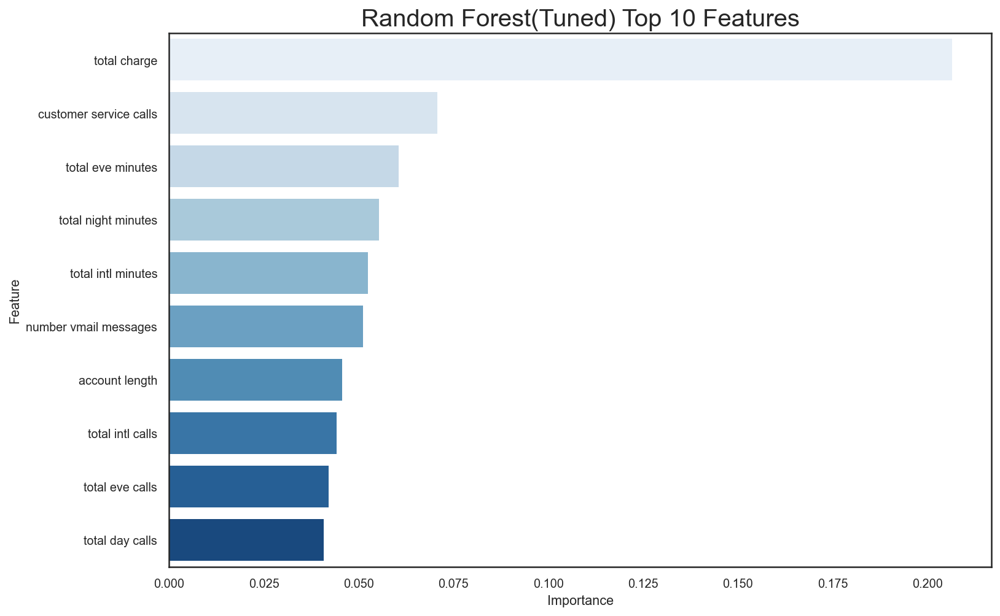

In [102]:
feat_import_rf2 = pd.DataFrame(zip(X_tr_sm_scaled.columns, rf2.feature_importances_),
                              columns=['Feature', 'Importance'])
sns.set_style('white')
fig, ax = plt.subplots(figsize=(12,8))
sns.barplot(x='Importance', y='Feature',
            data=feat_import_rf2.sort_values(by='Importance', ascending=False).head(10), orient='h',
            ax=ax, palette = 'Blues');
plt.title('Random Forest(Tuned) Top 10 Features' , fontdict={'fontsize' : 20});


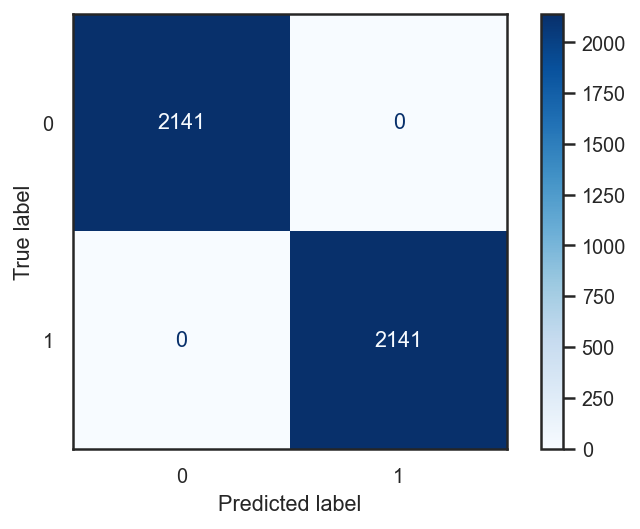

In [103]:
plot_confusion_matrix(rf2 , X_tr_sm_scaled , y_tr_sm , cmap = 'Blues')
sns.set_style( style = 'dark')

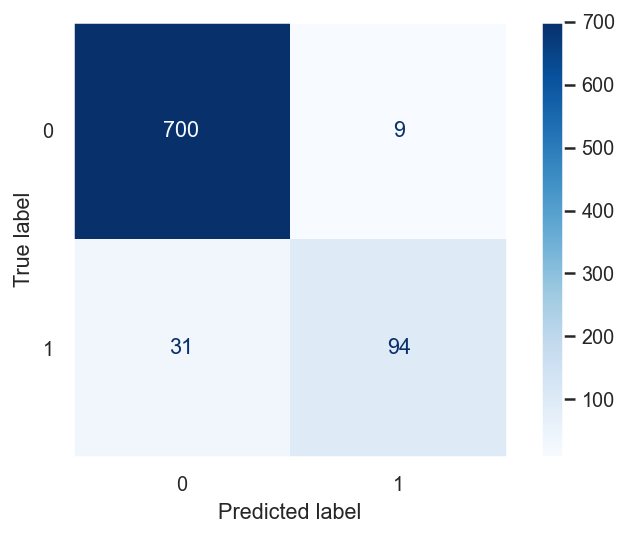

In [104]:
plot_confusion_matrix(rf2 , X_test_scaled , y_test , cmap = 'Blues')
sns.set_style( style = 'dark')

In [105]:
print(classification_report(y_tr_sm , rf2.predict(X_tr_sm_scaled)))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2141
           1       1.00      1.00      1.00      2141

    accuracy                           1.00      4282
   macro avg       1.00      1.00      1.00      4282
weighted avg       1.00      1.00      1.00      4282



In [106]:
print(classification_report(y_test , rf2.predict(X_test_scaled)))

              precision    recall  f1-score   support

           0       0.96      0.99      0.97       709
           1       0.91      0.75      0.82       125

    accuracy                           0.95       834
   macro avg       0.94      0.87      0.90       834
weighted avg       0.95      0.95      0.95       834



AUC: 0.8696530324400564


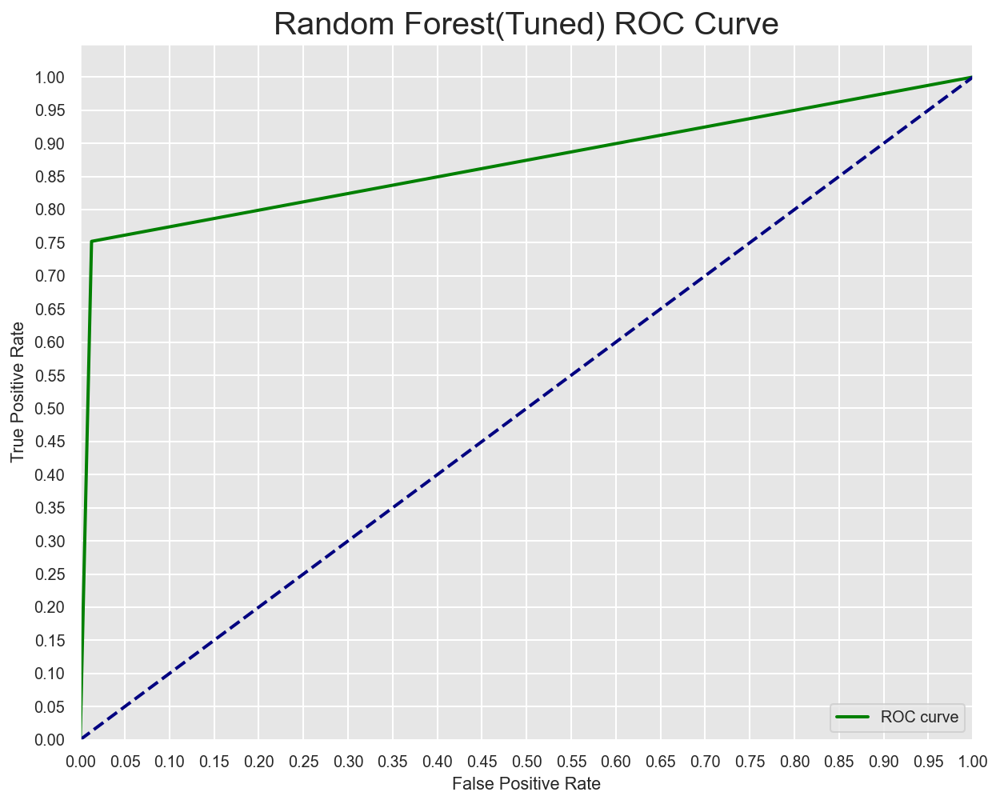

In [107]:
sns.set_style('darkgrid', {'axes.facecolor': '0.9'})
fpr, tpr, thresholds = roc_curve(y_test, rf2.predict(X_test_scaled))
print('AUC: {}'.format(auc(fpr, tpr)))
plt.figure(figsize=(10, 8))
lw = 2
plt.plot(fpr, tpr, color='green',
         lw=lw, label='ROC curve')
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.yticks([i/20.0 for i in range(21)])
plt.xticks([i/20.0 for i in range(21)])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Random Forest(Tuned) ROC Curve' , fontdict={'fontsize': 20})
plt.legend(loc='lower right')
plt.show()

In [108]:
rf2.score(X_test_scaled , y_test)

0.9520383693045563

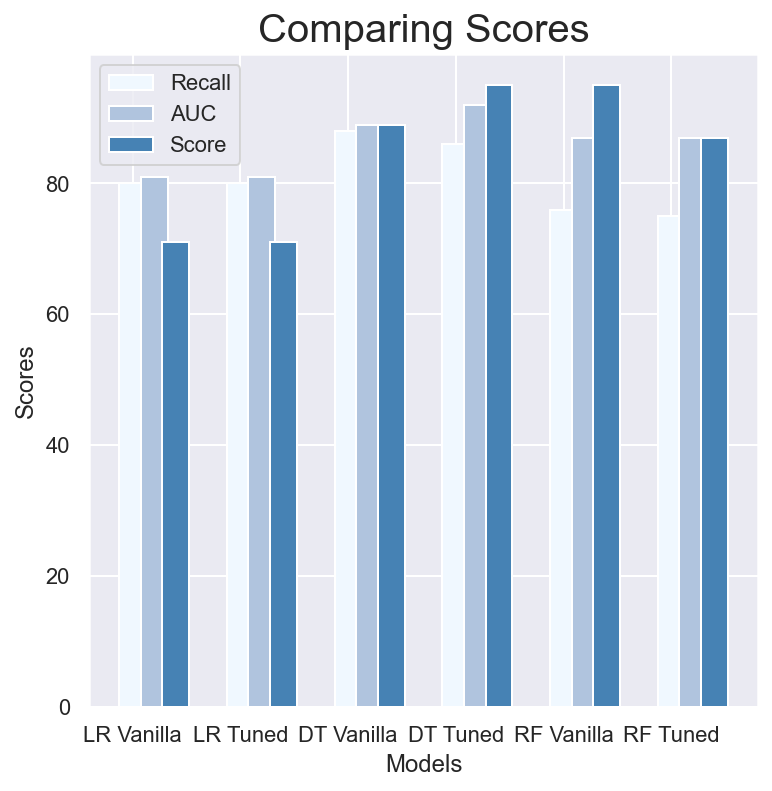

In [122]:
Recall = [80 , 80 , 88 , 86 , 76, 75]
AUC = [81 , 81 , 89 ,92 ,87 ,87]
Accuracy= [71 , 71 , 89 ,95 , 95, 87]
models=['LR Vanilla', 'LR Tuned','DT Vanilla','DT Tuned' , 'RF Vanilla' , 'RF Tuned']

X_axis = np.arange(len(models))
  
bar1 = plt.bar(X_axis , Recall, 0.25, label = 'Recall' ,color = 'aliceblue')
bar2 = plt.bar(X_axis+0.2 , AUC, 0.25, label = 'AUC', color = 'lightsteelblue')
bar3 = plt.bar(X_axis+0.4 , Accuracy, 0.25, label = 'Score', color = 'steelblue')

plt.xticks(X_axis, models)
plt.xlabel("Models")
plt.ylabel("Scores")
plt.title("Comparing Scores", fontdict={'fontsize' : 20})

sns.set(rc = {'figure.figsize':(8,8)})

plt.legend(loc = 0)
plt.show()

- After looking at all models it is obvious the DT Tuned model works the best as it has the highest AUC as well as other test metrics - including recall and accuracy. We would use this DT tuned model to predict which of the given customers in the data set will churn. Now Let's check the top 10 important factor on this model.

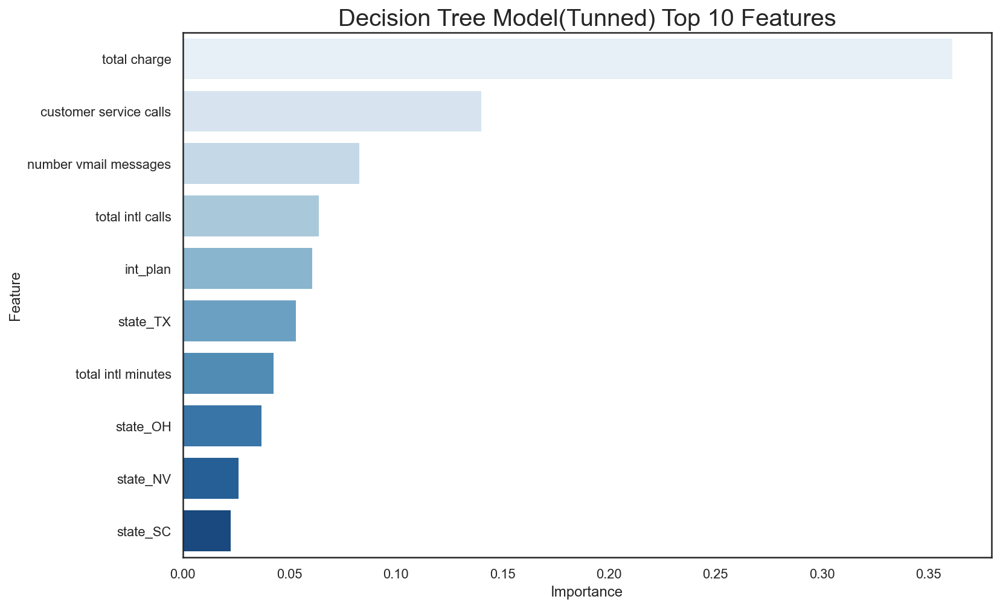

In [123]:
feat_imps_df2 = pd.DataFrame(zip(X_tr_sm_scaled.columns, dt2.feature_importances_),
                            columns=['Feature', 'Importance'])
sns.set_style('white')
fig, ax = plt.subplots(figsize=(12,8))
sns.barplot(x='Importance', y='Feature', 
            data=feat_imps_df2.sort_values(by='Importance', key=abs, ascending=False).head(10), orient='h', ax=ax ,
           palette = 'Blues');
plt.title('Decision Tree Model(Tunned) Top 10 Features' , fontdict={'fontsize' : 20});


## Conclusion & Recommendation

- Based on the highest score model in this notebook( Model 4: Decision Tree Tuned) I would recommend the following three business strategies to SyriaTel as a way to prevent losing customers to churn in the future.

1- We recommend the SyriaTell company to work on total charge and making promotions on this feature. We want to make sure that they get these offers to all people especially those who call customer service.

2- As the above bar suggests, the number of customer service call is the another important reason to churn. The more customer service calls, the more people leave the plan.

3- Another important factor is total internatiol calls . The Customer may not be happy for the international service or international call charge might be high. SyriaTel should offer discount to customers especially those who make a lot of international calls

## Next Step

1- We can get more competitors’ datasets to see if the reason of higher churn because of the competition at these states TX , OH , NV , SC.

2- We can test on more models such as Naive Bayes , K-Nearast Neigbor and Gradient Boosting to see if those models work well.